<a href="https://colab.research.google.com/github/GetupArjun/arjunEDA/blob/main/Copy_of_Bike_Sharing_Demand_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - Bike Sharing Demand Prediction



##### **Project Type**    - Machine Learning Regression
##### **Contribution**    - Individual
##### **Name -** Arjun Kumar


# **Project Summary -**

Bike demand prediction is a common problem faced by biker rental companies as accurately forecasting the demand for bike can help optimise investor and price strategy. In this project I am to deploy a regression supervised machine learning model to predict the demand for bike in a given time period.

Originally data set of bike rental information from a bike sharing company, had information including details on the number of bikes rented, the time and date of the rental and various weather and seasonality feature information on other relevant factor that could impact bike demand such as holiday, functioning or non functioning day.

After preprocessing and cleaning the data I split it into training and test set and use the training data to train our machine learning model. I experimented with several different model architecyures and hyperparameter setting ultimately selecting the model that performed the best on the test data.

To evaluate the performance of our model, I useed of various of matrix including mean absolute error, root mean square error and R_squared.

In addition to evaluating the performance of our model, on the test data, I also conducted a series of evolution studies to understand the impact of individual feature on the models performance. I found that the temperature as well as the weather and seasonality features had the greatest impact on bike demand.

# **GitHub Link -**

Provide your GitHub Link here.

# **Problem Statement**


Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort. It is important to make the recent bike available and accessible to the public at the right time as its lessens the waiting time. Eventually providing the city with stable supply or rental bikes become a major concern. the crucius part is the prediction of bike account required at each our for the stable supply to rental bikes.

My goal is to develop a model that is highly accurate, with a low mean absolute error and high R_squared value. The model should also be able to provide inside into the factor that most impact bike demand helping the bike sharing company to make data drive decisions about how the optimize their operations.

# ***Let's Begin !***

# ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
from warnings import filterwarnings
filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
%matplotlib inline

### Dataset Loading

In [ ]:
# Load Dataset
from google.colab import drive
drive.mount('/content/drive')

A=pd.read_csv("/content/drive/MyDrive/SeoulBikeData.csv",encoding="latin")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Dataset First View

In [ ]:
# Viewing the data of top 5 rows to take a glimps of the data
A.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [ ]:
# Viewing the data of top 5 rows to take a glimps of the data
A.tail()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes
8759,30/11/2018,584,23,1.9,43,1.3,1909,-9.3,0.0,0.0,0.0,Autumn,No Holiday,Yes


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
A.shape

(8760, 14)

In [ ]:
A.size

122640

### Dataset Information

In [ ]:
# Dataset Info
A.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
A.duplicated().sum()

0

There is no duplicate value in our data.

When you have duplicate records, it is more difficult for software to correctly match people to behaviors. You could have one individual represented through multiple profiles, which give increased weight to that particular person’s activities.

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
A.isna().sum().sort_values(ascending=False)

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

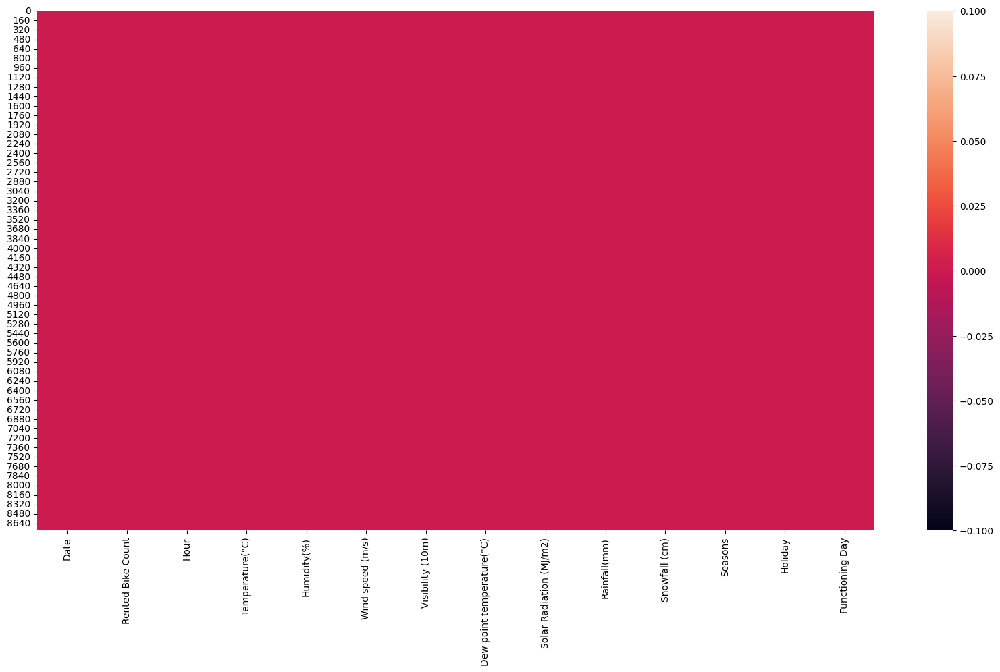

In [ ]:
# Visualizing the missing values
fig,axes = plt.subplots(1,1,figsize=(20,10))
sb.heatmap(A.isna())
plt.show()

### What did you know about your dataset?



*   There are 8760 observations and 14 features.

*   In a day we have 24 hours and we have 365 days a year so 365 multiplied by
    24=8760, which represent the number of line in the dataset.
    
*   There are no null values.


*    Dataset has unique values i.e.,there is no duplicate, which means data is free from bias as duplicates which can caues problems in downstream analysis, such as biasing results or making it difficult to accurately summarize the data.



*   Data column has same object data type , it should be datetime data type.






## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns

list(A.columns)

['Date',
 'Rented Bike Count',
 'Hour',
 'Temperature(°C)',
 'Humidity(%)',
 'Wind speed (m/s)',
 'Visibility (10m)',
 'Dew point temperature(°C)',
 'Solar Radiation (MJ/m2)',
 'Rainfall(mm)',
 'Snowfall (cm)',
 'Seasons',
 'Holiday',
 'Functioning Day']

In [ ]:
# Dataset Describe

A.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


### Variables Description

Date: The data of the day, during 365 days from 01/12/2017 to 30/11/2018, forming in DD/MM/YYYY, type: str, we need to convert into datetime formate.

Rented Bike Count: Number of rented bikes per hour which our dependent variable and we need to predict that, type: int.

Hour: The hour of the day, Starting from 0-23 it's in a digital time formate, type: int, we need to convert it into category date type.

Temperature(°C): Temperature in celsius , type: Flot.

Humidity(%): Humidity in air % , type: int.

Wind speed (m/s): Speed of the Wind speed in m/s,type: Float.

Visibility (m): Visibility in m, type: int.

Dew point temperature(°C): Temperature at the beggining of the day. type: Flot.

Solar Radiation (MJ/m2): Sun contribution, type:Flot.

Rainfall(mm): Amount of raining in mm, type: Flot.

Snowfall (cm): Amount of snowfalling in cm. type:Flot.

Seasons: Seasons of the year , type: str, there are only 4 seasion's in data.

Holiday: If the day is holiday period or not, type:str.

Functioning Day: If the day is a Functioning Day or not , type:str.

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.

for i in A.columns:
    print(i, len(A[i].unique()))

Date 365
Rented Bike Count 2166
Hour 24
Temperature(°C) 546
Humidity(%) 90
Wind speed (m/s) 65
Visibility (10m) 1789
Dew point temperature(°C) 556
Solar Radiation (MJ/m2) 345
Rainfall(mm) 61
Snowfall (cm) 51
Seasons 4
Holiday 2
Functioning Day 2


# ***2. Data Wrangling***

### Changing column name

Some of the columns name in the dataset are too large and clumsy so we change the into some simple name, and it dont's affect our end results.

In [ ]:
# Rename the complex columns name

A=A.rename(columns={"Rented Bike Count":"Rented_Bike_Count",
                    "Temperature(°C)":"Temperature",
                    "Humidity(%)":"Humidity",
                    "Wind speed (m/s)":"Wind_speed",
                    "Visibility (10m)":"Visibility",
                    "Dew point temperature(°C)":"Dew_point_temperature",
                    "Solar Radiation (MJ/m2)":"Solar_Radiation",
                    "Rainfall(mm)":"Rainfall",
                    "Snowfall (cm)":"Snowfall",
                    "Functioning Day":"Functioning_Day"})

### Breaking data column

Python read "Date" column as a object type basically it reads as a string, as the date column is very important to analyze the user behaviour so we need to convert it into datetime formate then we split it into 3 column i.e "year", "month", "day" as a category data type.

In [ ]:
# Import Datetime library for manipulating Date columns.
from datetime import datetime
import datetime as dt

In [ ]:
#changing the date column into three "year","month","day" column
A["Date"]=A["Date"].str.replace("-","/")
A["Date"]=A["Date"].apply(lambda x: dt.datetime.strptime(x,"%d/%m/%Y"))

In [ ]:
A["year"]=A["Date"].dt.year
A["month"]=A["Date"].dt.month
A["day"]=A["Date"].dt.day_name()

In [ ]:
A["weekday_weekend"]=A["day"].apply(lambda x : 1 if x=="Saturday" or x=="Sunday" else 0)
A=A.drop(columns=["Date","day","year"],axis=1)

In [ ]:
A.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,month,weekday_weekend
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,0
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,0
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,12,0
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,0
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,0


In [ ]:
A["weekday_weekend"].value_counts()

0    6264
1    2496
Name: weekday_weekend, dtype: int64

*   So we convert the "date" column into 3 different column i.e "year","month" and "day".
*   The "year" column in our data set is basically contain the 2 unique number contains the details of from 2017 december to 2018 november so if i consider this is a one year then we dont need the "year" column so we drop it.

*    The other column "day", it contain the details about the each day of the month, for our relevence we dont need each day of each month data but we need the data about, if a day is a weekday or a weekend so we convert it into this formate and drop the "day" column.




### Changing data type



*   As "Hour","month","weekdays_weekend" column are show as a integer data type but actually it is a object data type. so we need to change this data type if we not then, while doing the futher analysis and correleted with this then the values are not actually true so we can mislead by this.



In [ ]:
A.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Rented_Bike_Count      8760 non-null   int64  
 1   Hour                   8760 non-null   int64  
 2   Temperature            8760 non-null   float64
 3   Humidity               8760 non-null   int64  
 4   Wind_speed             8760 non-null   float64
 5   Visibility             8760 non-null   int64  
 6   Dew_point_temperature  8760 non-null   float64
 7   Solar_Radiation        8760 non-null   float64
 8   Rainfall               8760 non-null   float64
 9   Snowfall               8760 non-null   float64
 10  Seasons                8760 non-null   object 
 11  Holiday                8760 non-null   object 
 12  Functioning_Day        8760 non-null   object 
 13  month                  8760 non-null   int64  
 14  weekday_weekend        8760 non-null   int64  
dtypes: f

In [ ]:
# change the int64 column into object column
cols=["Hour","month","weekday_weekend"]
for col in cols:
  A[col]=A[col].astype("object")

In [ ]:
A.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Rented_Bike_Count      8760 non-null   int64  
 1   Hour                   8760 non-null   object 
 2   Temperature            8760 non-null   float64
 3   Humidity               8760 non-null   int64  
 4   Wind_speed             8760 non-null   float64
 5   Visibility             8760 non-null   int64  
 6   Dew_point_temperature  8760 non-null   float64
 7   Solar_Radiation        8760 non-null   float64
 8   Rainfall               8760 non-null   float64
 9   Snowfall               8760 non-null   float64
 10  Seasons                8760 non-null   object 
 11  Holiday                8760 non-null   object 
 12  Functioning_Day        8760 non-null   object 
 13  month                  8760 non-null   object 
 14  weekday_weekend        8760 non-null   object 
dtypes: f

In [ ]:
A.columns

Index(['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day', 'month',
       'weekday_weekend'],
      dtype='object')

# ***3. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

Explratory Data Analysis of Tha Data set

#### Chart - 1
Plot the relation of month with our dependent variable

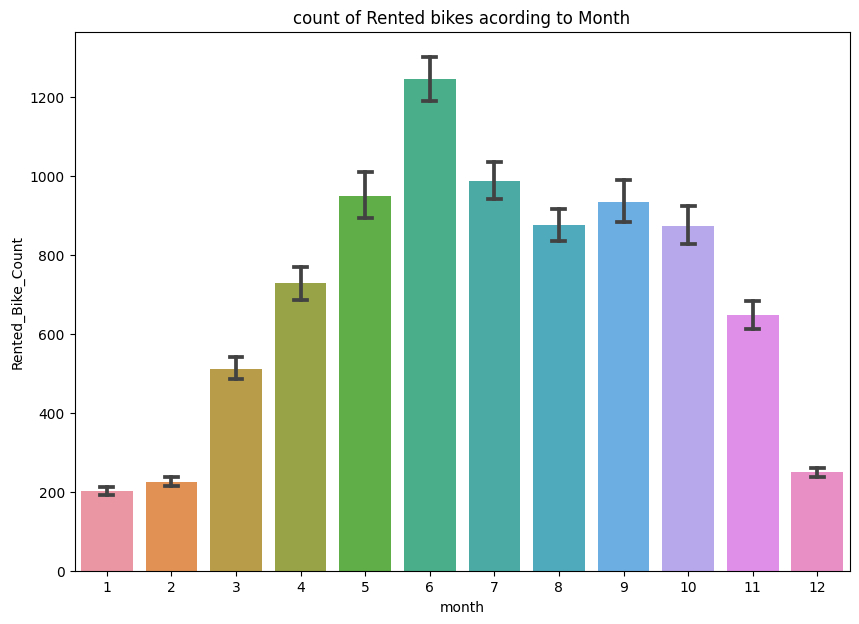

In [ ]:
# Analysis the data by visualization, X=Month ,Y=Rented_Bike_Count

fig,ax=plt.subplots(figsize=(10,7))
sb.barplot(data=A,x="month",y="Rented_Bike_Count",ax=ax,capsize=0.2)
ax.set(title="count of Rented bikes acording to Month")
plt.show()




*   From the above bar plot we can clearly say that, from the month 5 to 10 (May-October) the demand of the rented bike is high as compare to other months.These months came inside the summer season.



#### Chart - 2
Plot the relation of weekday_weekend with our dependent variable

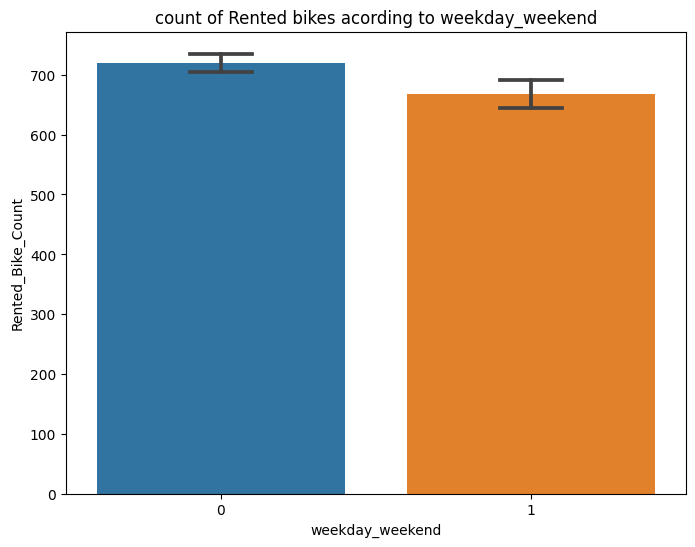

In [ ]:
# Analysis the data by visualization, X=weekday_weekend, Y=Rented_Bike_Count

fig,ax=plt.subplots(figsize=(8,6))
sb.barplot(data=A,x="weekday_weekend",y="Rented_Bike_Count",ax=ax,capsize=0.2)
ax.set(title="count of Rented bikes acording to weekday_weekend")
plt.show()

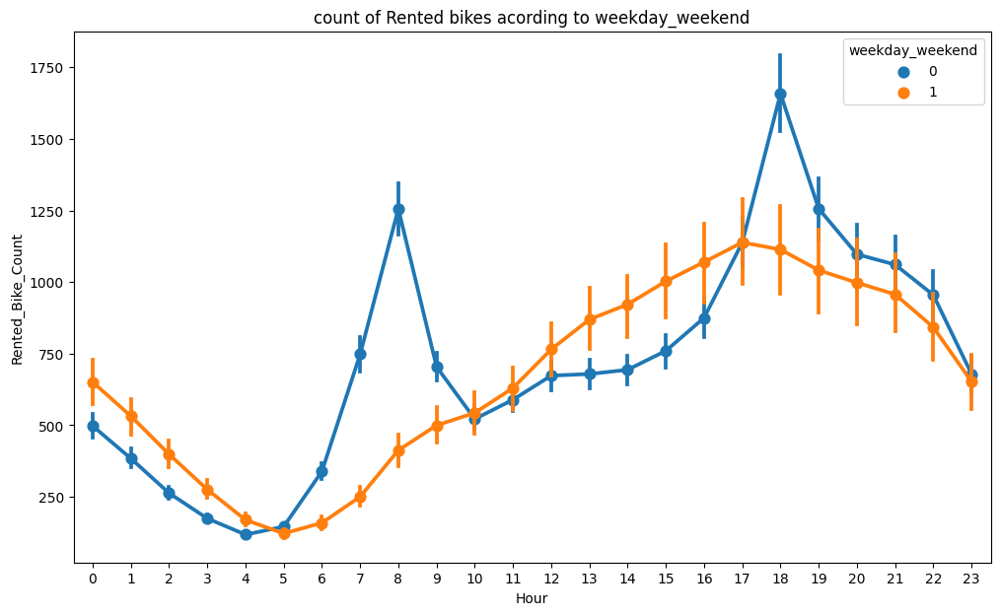

In [ ]:
# Analysis the data by visualization

fig,ax=plt.subplots(figsize=(12,7))
sb.pointplot(data=A,x="Hour",y="Rented_Bike_Count",ax=ax, hue="weekday_weekend")
ax.set(title="count of Rented bikes acording to weekday_weekend")
plt.show()



*   From the above point plot and bar plot we can say that, in the week days which represent in blue color show that the demand of the bike higher becaues of the office.

*   peak timeing are 7am to 9am and 5pm to 7pm.
*   The orange color represent the weekend days, and it show that the demand of rented bikes are very low specially in the morning hour but when the evening start from 4pm to 8pm the demand slightly increases.






#### Chart - 3
Plot the relation of Hour with our dependent variable

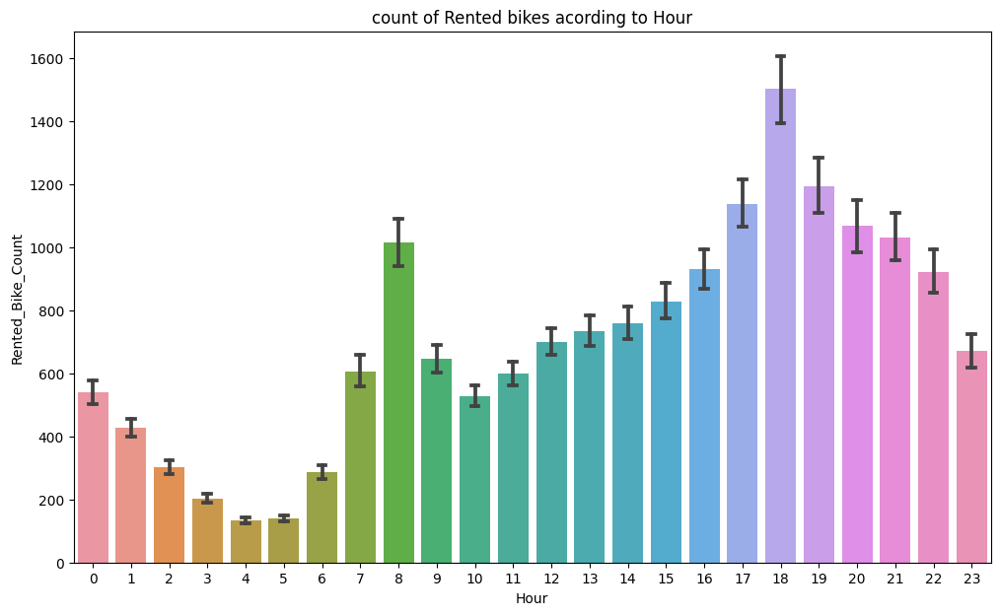

In [ ]:
# Analysis the data by visualization, X=Hour, Y=Rented_Bike_Count

fig,ax=plt.subplots(figsize=(12,7))
sb.barplot(data=A,x="Hour",y="Rented_Bike_Count",ax=ax, capsize=0.2)
ax.set(title="count of Rented bikes acording to Hour")
plt.show()



*   In the above plot which shows,that use of rented bike according the hours and data are from all over the year.
*   Generally people use rented bikes during their working hour from 7am to 9am and 5pm to 7pm.



#### Chart - 4

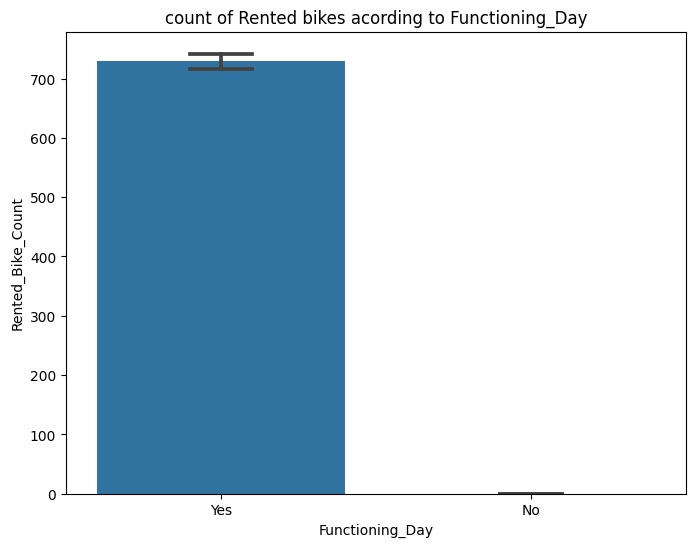

In [ ]:
# Analysis the data by visualization,  X=Functioning_Day, Y=Rented_Bike_Count

fig,ax=plt.subplots(figsize=(8,6))
sb.barplot(data=A,x="Functioning_Day",y="Rented_Bike_Count",ax=ax, capsize=0.2)
ax.set(title="count of Rented bikes acording to Functioning_Day")
plt.show()

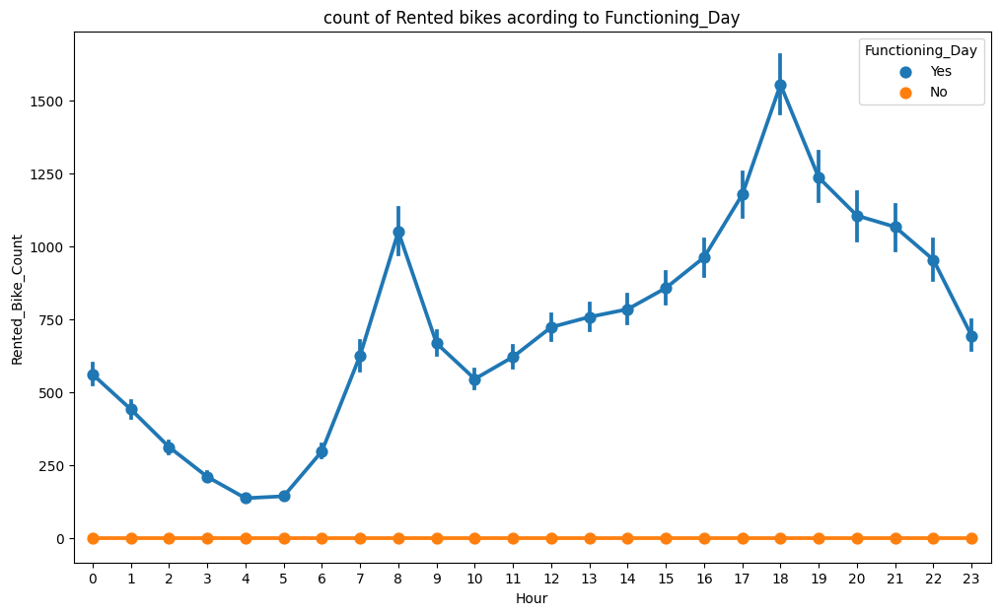

In [ ]:
# Analysis the data by visualization.

fig,ax=plt.subplots(figsize=(12,7))
sb.pointplot(data=A,x="Hour",y="Rented_Bike_Count",ax=ax, hue="Functioning_Day")
ax.set(title="count of Rented bikes acording to Functioning_Day")
plt.show()



*   In the above bar plot and point plot which show the rented bike in functioning day or non functioning day , and it clearly shows that.


*   People don't use rented bikes in no functioning day.



#### Chart - 5

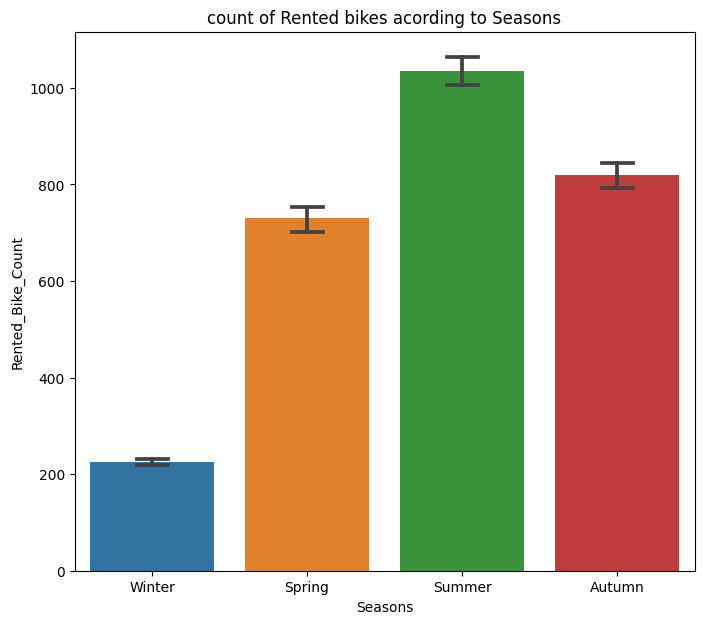

In [ ]:
# Analysis the data by visualization, X=Seasons, Y=Rented_Bike_Count

fig,ax=plt.subplots(figsize=(8,7))
sb.barplot(data=A,x="Seasons",y="Rented_Bike_Count",ax=ax, capsize=0.2)
ax.set(title="count of Rented bikes acording to Seasons")
plt.show()

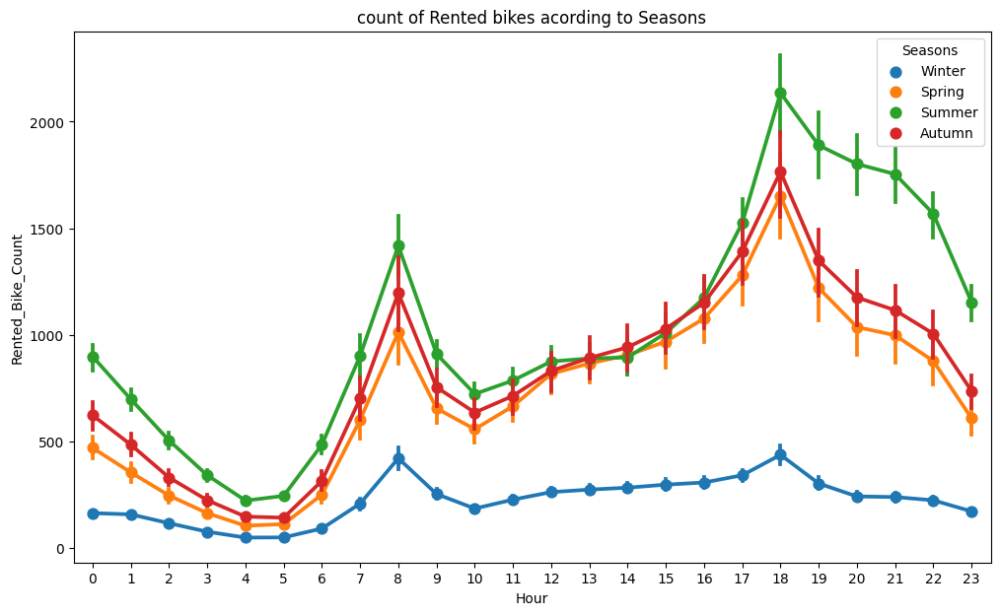

In [ ]:
# Analysis the data by visualization

fig,ax=plt.subplots(figsize=(12,7))
sb.pointplot(data=A,x="Hour",y="Rented_Bike_Count",ax=ax, hue="Seasons")
ax.set(title="count of Rented bikes acording to Seasons")
plt.show()



*   In the above bar plot and point plot which show the rented bike in four different seasons, and it clearly shows that,





*   In summer season the use of rented bike is high and peak time is 7am-9am and 5pm-7pm.
*   In winter season the use of rented bike is very low maybe because of snowfall,fog,cold etc.






#### Chart - 6

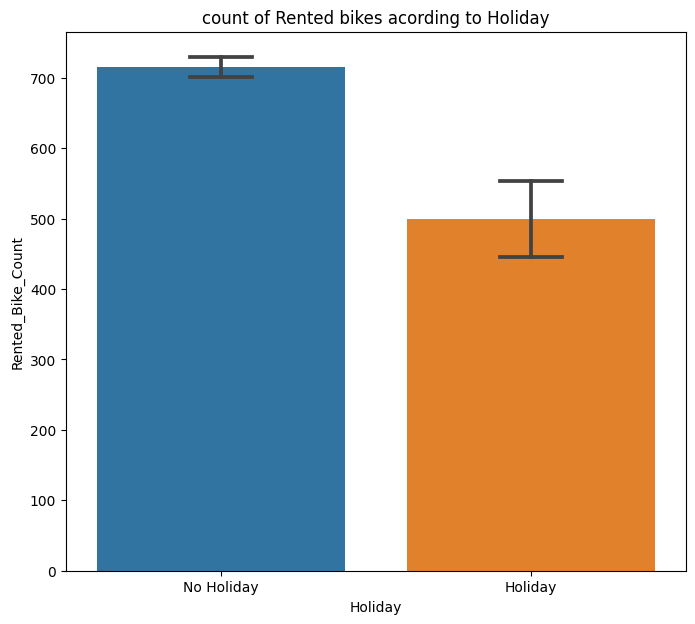

In [ ]:
#  Analysis the data by visualization,  X=Holiday, Y=Rented_Bike_Count

fig,ax=plt.subplots(figsize=(8,7))
sb.barplot(data=A,x="Holiday",y="Rented_Bike_Count",ax=ax, capsize=0.2)
ax.set(title="count of Rented bikes acording to Holiday")
plt.show()

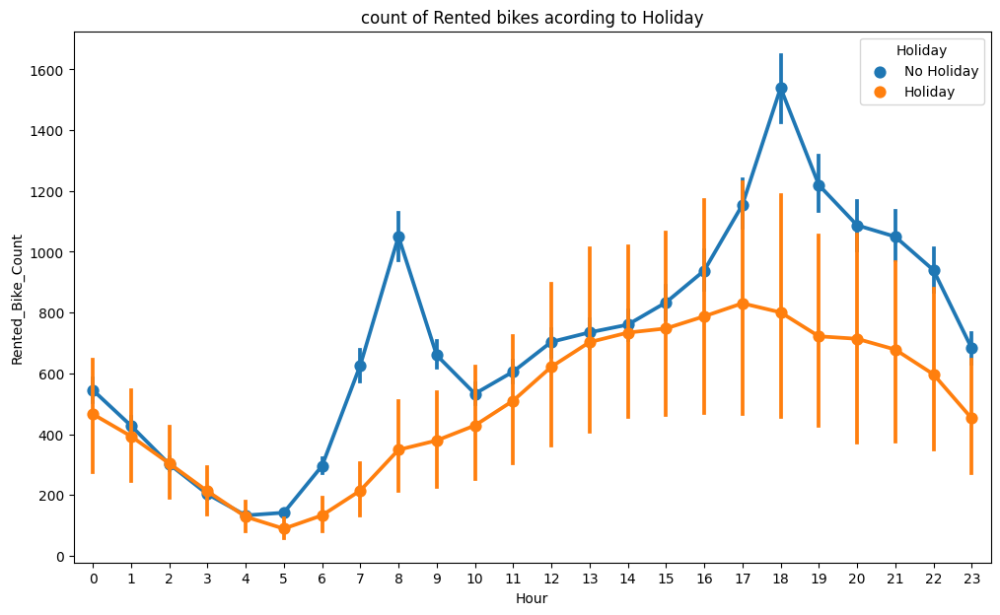

In [ ]:
# Analysis the data by visualization

fig,ax=plt.subplots(figsize=(12,7))
sb.pointplot(data=A,x="Hour",y="Rented_Bike_Count",ax=ax, hue="Holiday")
ax.set(title="count of Rented bikes acording to Holiday")
plt.show()



*   In the above bar plot and point plot which show the rented bike in a holiday,and it clearly shows that,


*   In holidays people use tha rented bike from 2pm-8pm.



#### Chart - 7

Analyze of Numerical Variables

Skewness of our numerical features

In [ ]:
# separate numerical feature from the dataframe
cat=[]
con=[]

In [ ]:
for i in A.columns:
    if(A[i].dtype=="object"):
      cat.append(i)
    else:
      con.append(i)

In [ ]:
A[cat].head()

,Hour,Seasons,Holiday,Functioning_Day,month,weekday_weekend
0,0,Winter,No Holiday,Yes,12,0
1,1,Winter,No Holiday,Yes,12,0
2,2,Winter,No Holiday,Yes,12,0
3,3,Winter,No Holiday,Yes,12,0
4,4,Winter,No Holiday,Yes,12,0


In [ ]:
A[con].head()

,Rented_Bike_Count,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall
0,254,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0
1,204,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0
2,173,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0
3,107,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0
4,78,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0


In [ ]:
nrows=round(A.shape[1]/3,0)
nrows

5.0

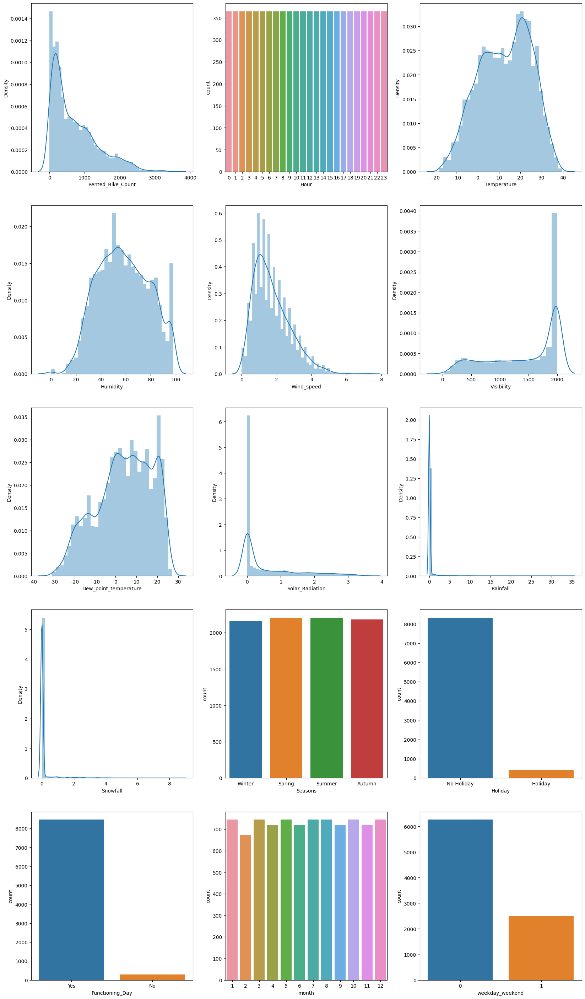

In [ ]:
x = 1
plt.figure(figsize=(20,80))
for i in A.columns:
    if A[i].dtypes == 'object':
        plt.subplot(11,3,x)
        sb.countplot(x=A[i],data=A)
        x = x + 1
    else:
        plt.subplot(11,3,x)
        sb.distplot(A[i])
        x = x + 1

### Right skewed columns are

 Rented_Bike_Count(its also our Dependent variable), Wind_speed, Solar_Radiation, Rainfall, Snowfall.

### Left skewed columns are

Visibility, Dew_point_temperature

#### Chart - 8
Lets try to find how is the relation of numerical features with our dependent variable

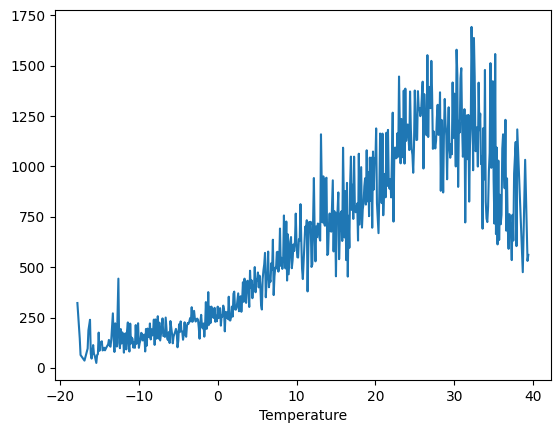

In [ ]:
#print the plot to analyze the relationship between "Rented_Bike_Count" and "Temperature"
A.groupby("Temperature").mean()["Rented_Bike_Count"].plot()
plt.show()



*   
From the above plot we see that, people like to ride bikes when it is pretty hot around 25°C in average


#### Chart - 9

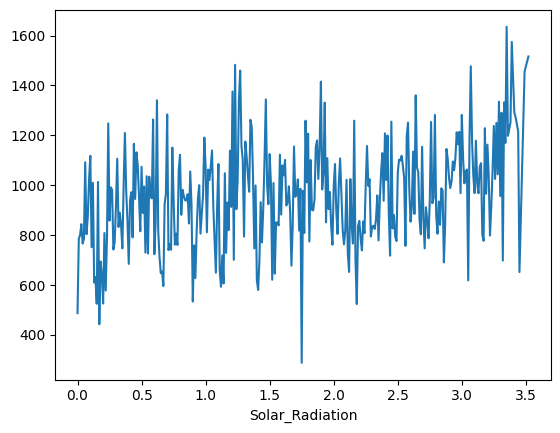

In [ ]:
#print the plot to analyze the relationship between "Rented_Bike_Count" and "Solar_Radiation"
A.groupby("Solar_Radiation").mean()["Rented_Bike_Count"].plot()
plt.show()



*   From the above plot we see that, the amount of rented bikes is huge when there is solar radiation, the count of rents is around 1000



#### Chart - 10

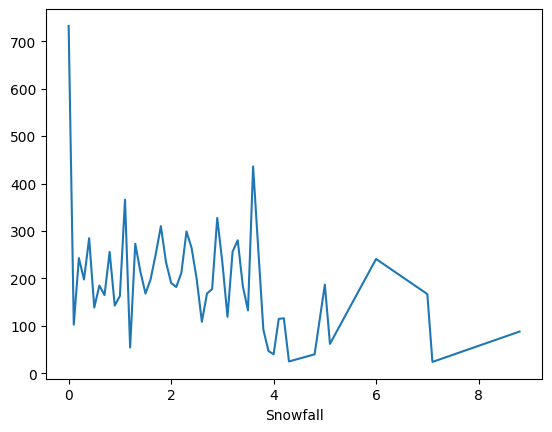

In [ ]:
#print the plot to analyze the relationship between "Rented_Bike_Count" and "Snowfall"
A.groupby("Snowfall").mean()["Rented_Bike_Count"].plot()
plt.show()



*   We can see from the plot that, on the y-axis, the amount of rented bike is very low. When we have more then 4 cm of snow, the bike rents is much lower



#### Chart - 11

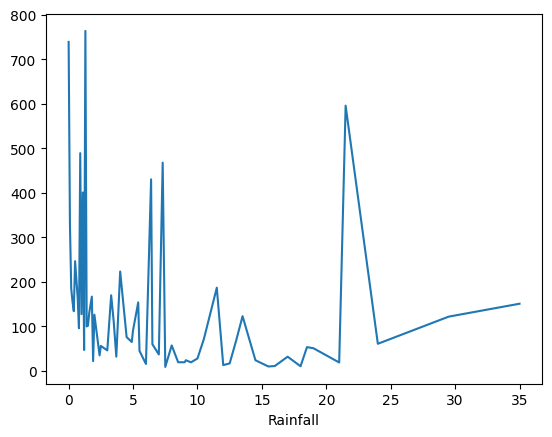

In [ ]:
#print the plot to analyze the relationship between "Rented_Bike_Count" and "Rainfall"
A.groupby("Rainfall").mean()["Rented_Bike_Count"].plot()
plt.show()



*   We can see from the above plot that, even if it rains a lot the demand of rent bikes is not decreasing, here for example even if we have 20mm of rain there is a big peak of rented bikes.



#### Chart - 12

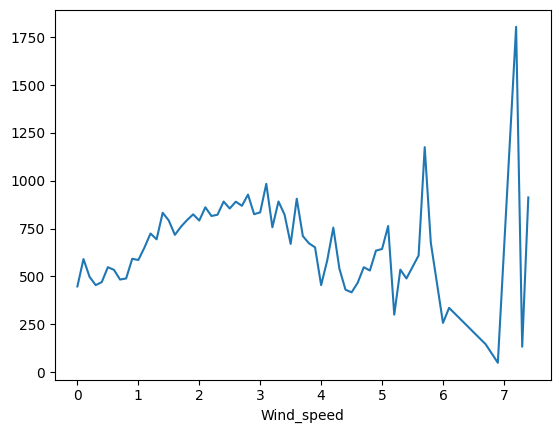

In [ ]:
#print the plot to analyze the relationship between "Rented_Bike_Count" and "Wind_speed"
A.groupby("Wind_speed").mean()["Rented_Bike_Count"].plot()
plt.show()



*   We can see from the above plot that, the demand of rented bike is uniformly distribute despite of wind speed but when the speed of wind is 7m/s then the demand of bike also increase that clearly means people love to ride bikes when its little windy.



#### Chart - 13

REGRESSION PLOT

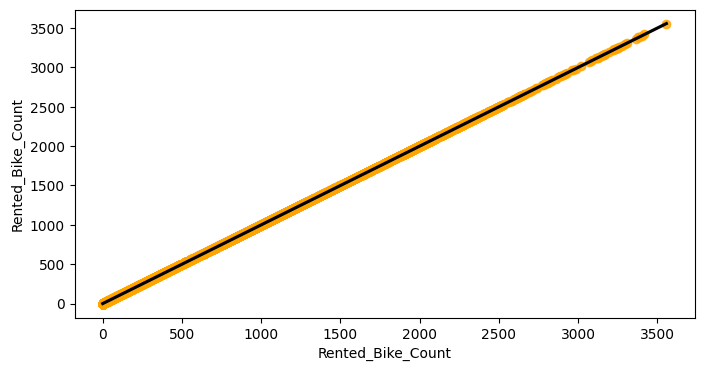

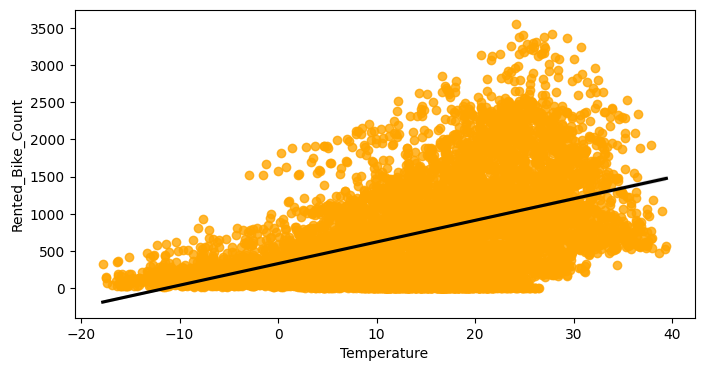

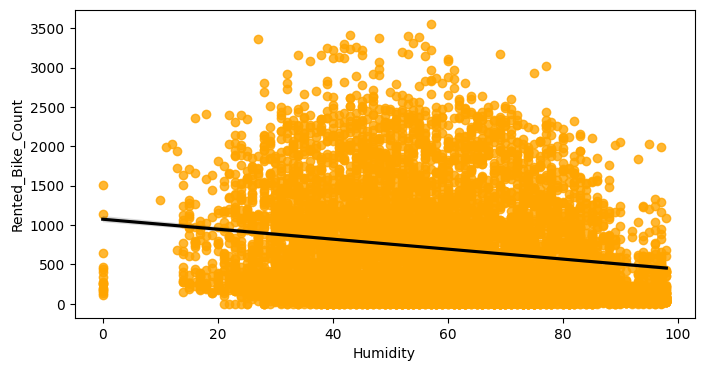

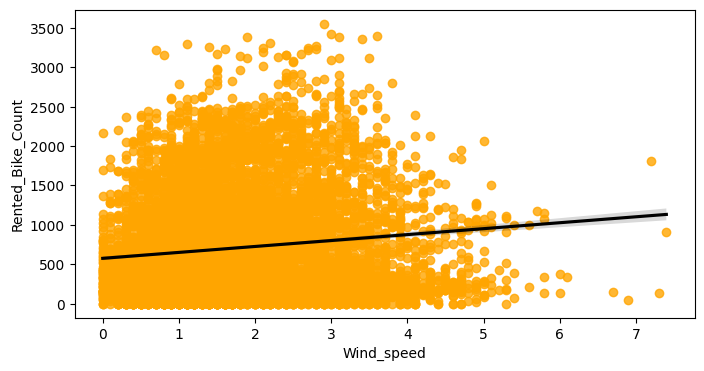

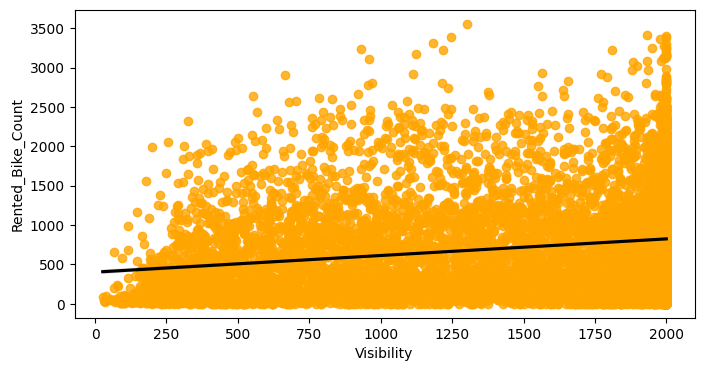

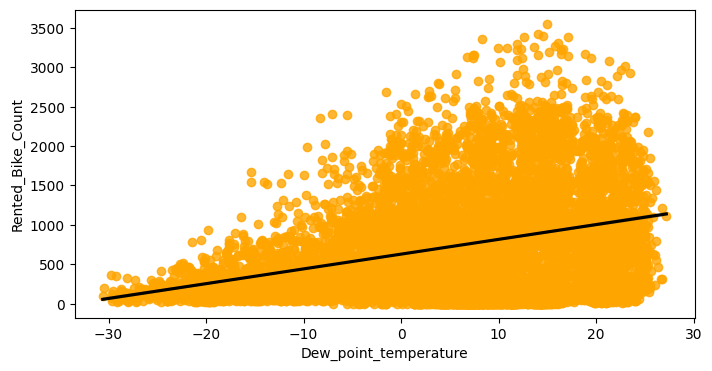

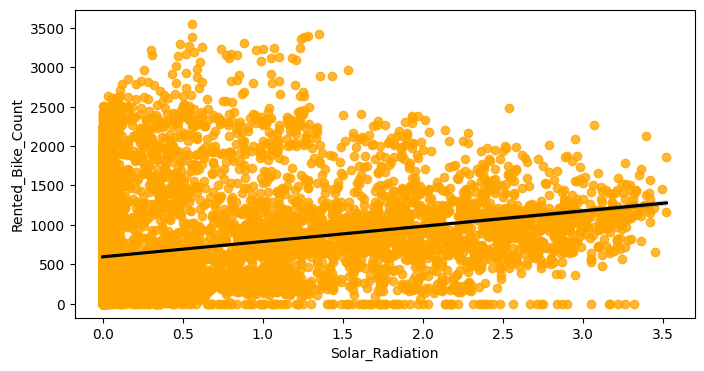

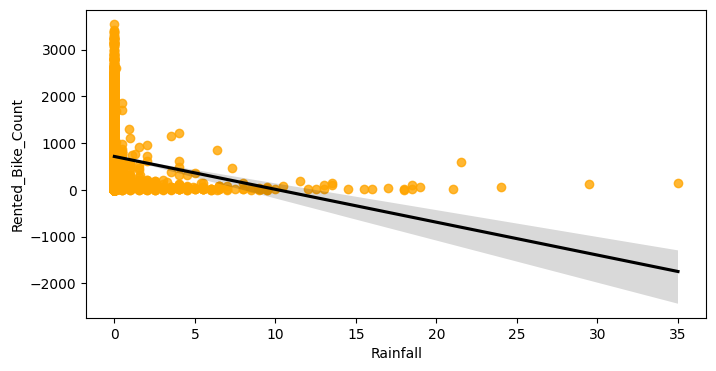

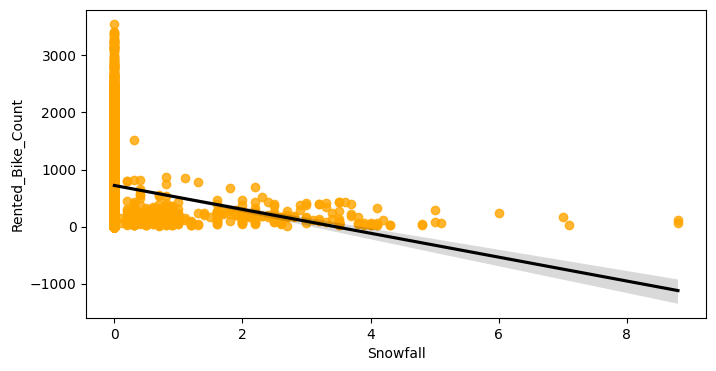

In [ ]:
#printing the regression plot for all the numerical features
for col in A[con]:
  fig,ax=plt.subplots(figsize=(8,4))
  sb.regplot(x=A[col],y=A["Rented_Bike_Count"],scatter_kws={"color":"orange"},line_kws={"color":"black"})



*   From the above regression plot of all numerical features we see that the columns "Temperature","Wind_speed","Visibility","Dew_point_temperature","Solar_Radiation" are positively relation to the target variable.



*   Which means the rented bike count increase with increase of these features.
*   "Rainfall","Snowfall","Humidity" these feature are negatively related with the target variable which means that rented bike count decreases when these features increase.






#### Chart - 14 - Correlation Heatmap

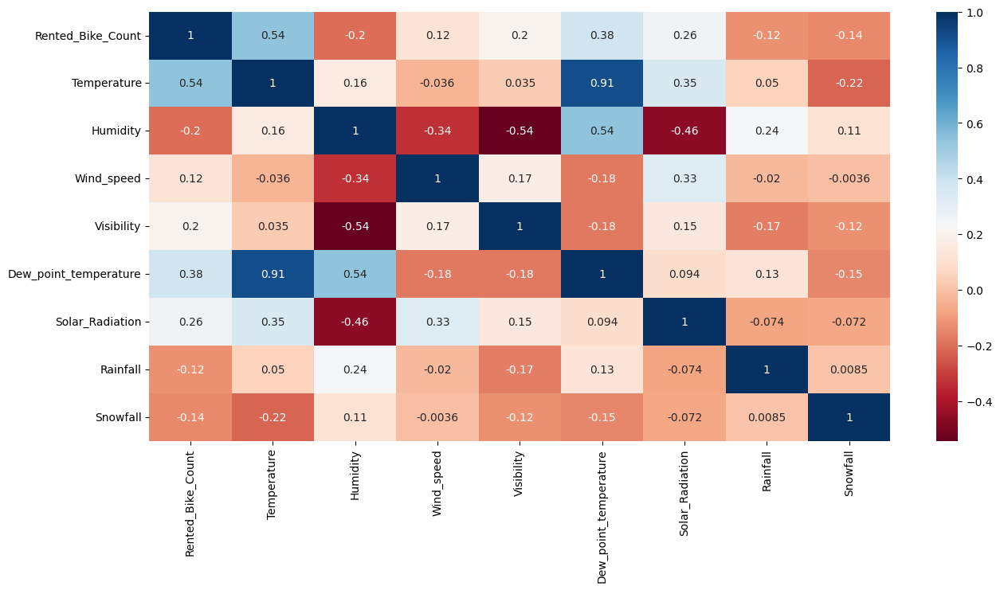

In [ ]:
# Correlation Heatmap visualization code

plt.figure(figsize=(15,7))
sb.heatmap(A.corr(), cmap="RdBu", annot=True)
plt.show()

We can observe on the heatmap that on the target variable line, the most positive correlated variables to the rent are:3) The solar radiation



*   The Temperature

*   The dew point Temperature
*   The solar radiation






And most negatively correlated variables are:


*   Humidity
*   Rainfall



#### Chart - 15 - Pair Plot

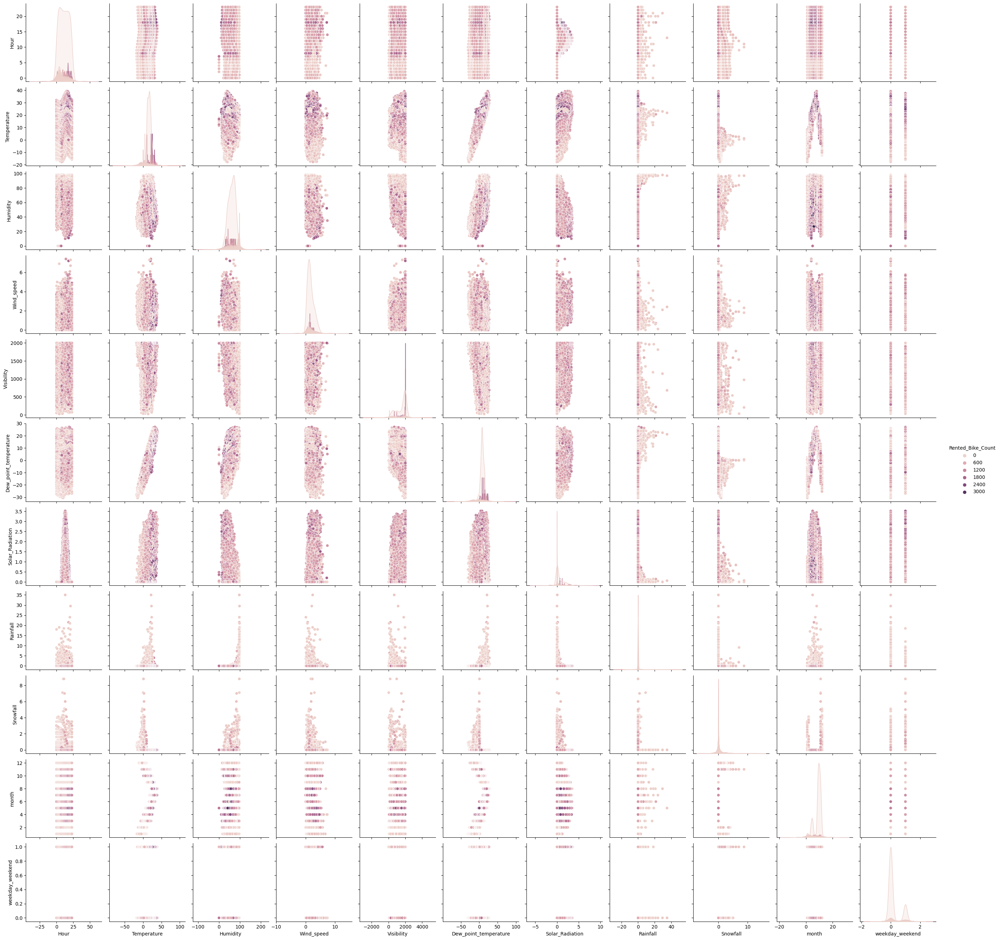

In [ ]:
# Pair Plot visualization code
sb.pairplot(A, hue = 'Rented_Bike_Count')


## ***5. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [ ]:
# Handling Missing Values & Missing Value Imputation

A.isna().sum().sort_values(ascending=False)

Rented_Bike_Count        0
Hour                     0
Temperature              0
Humidity                 0
Wind_speed               0
Visibility               0
Dew_point_temperature    0
Solar_Radiation          0
Rainfall                 0
Snowfall                 0
Seasons                  0
Holiday                  0
Functioning_Day          0
month                    0
weekday_weekend          0
dtype: int64

Data has no missing values.

### 2. Handling Outliers

In [ ]:
# find categorical variables
categorical = [var for var in A.columns if A[var].dtype=='O']
print('There are {} categorical variables'.format(len(categorical)))

There are 6 categorical variables


In [ ]:
# find Numerical variables
numerical = [var for var in A.columns if A[var].dtype!='O']
print('There are {} numerical variables'.format(len(numerical)))

There are 9 numerical variables


In [ ]:
numerical

['Rented_Bike_Count',
 'Temperature',
 'Humidity',
 'Wind_speed',
 'Visibility',
 'Dew_point_temperature',
 'Solar_Radiation',
 'Rainfall',
 'Snowfall']

In [ ]:
# we drop "Rented_Bike_Count" becaues "Rented_Bike_Count" is our targeted column.
continuous = [var for var in numerical if var in numerical and var not in ['Rented_Bike_Count']]

In [ ]:
continuous

['Temperature',
 'Humidity',
 'Wind_speed',
 'Visibility',
 'Dew_point_temperature',
 'Solar_Radiation',
 'Rainfall',
 'Snowfall']

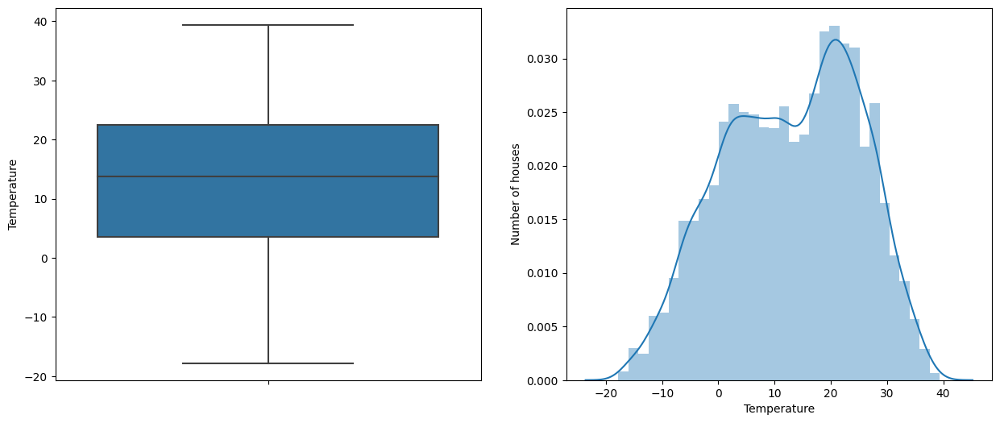

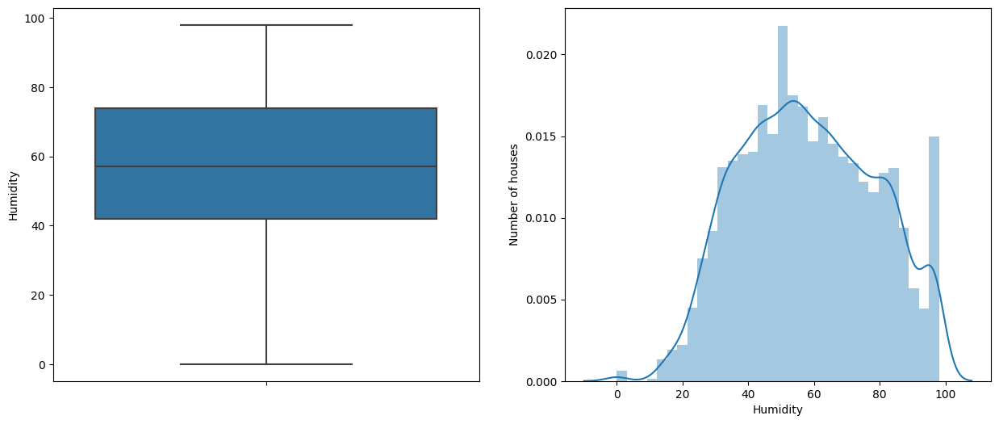

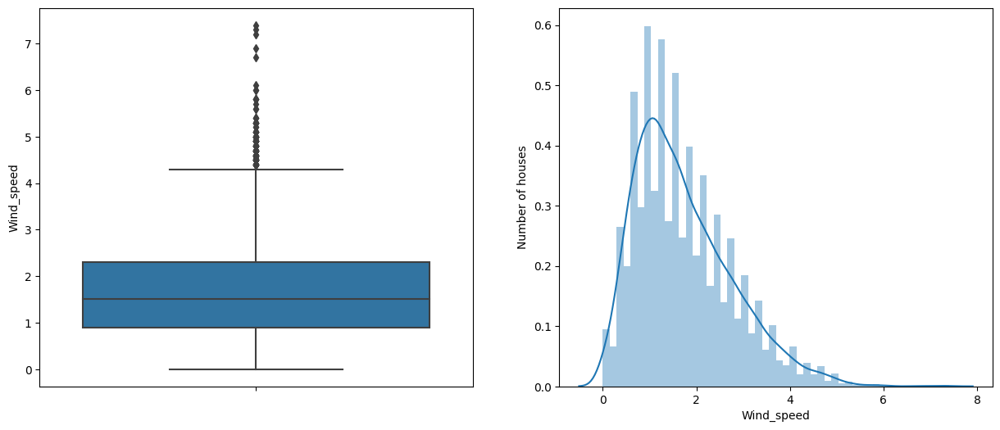

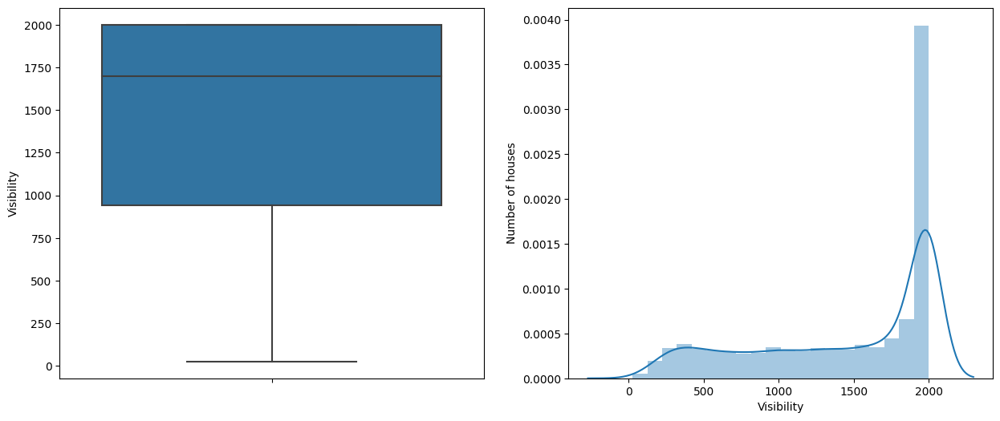

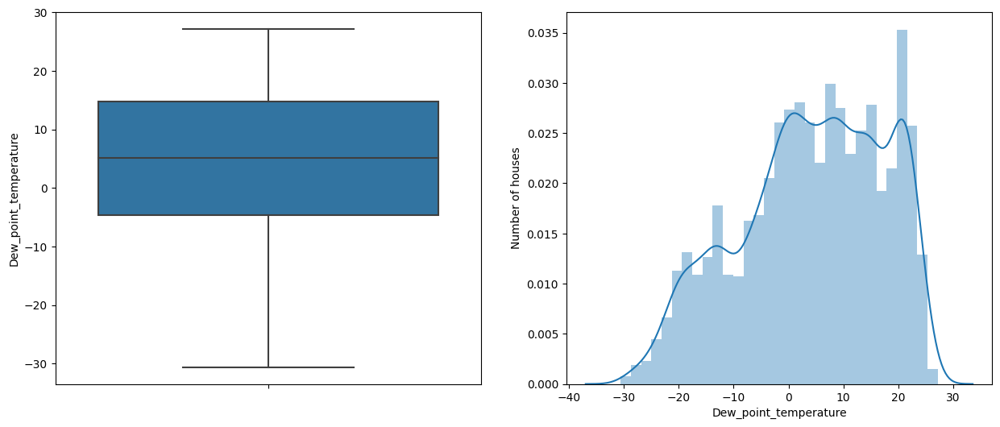

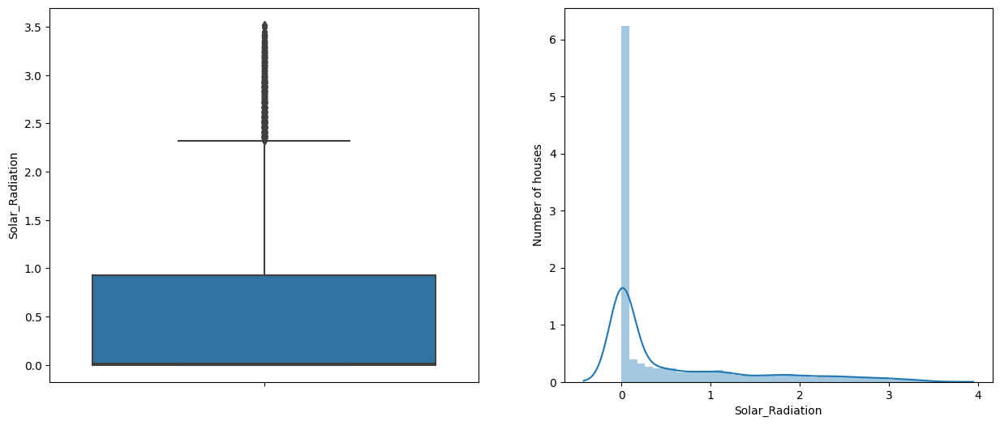

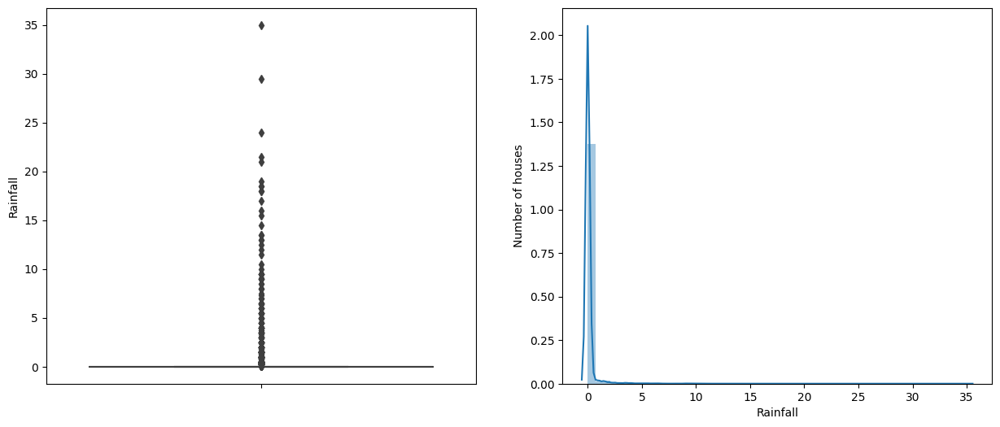

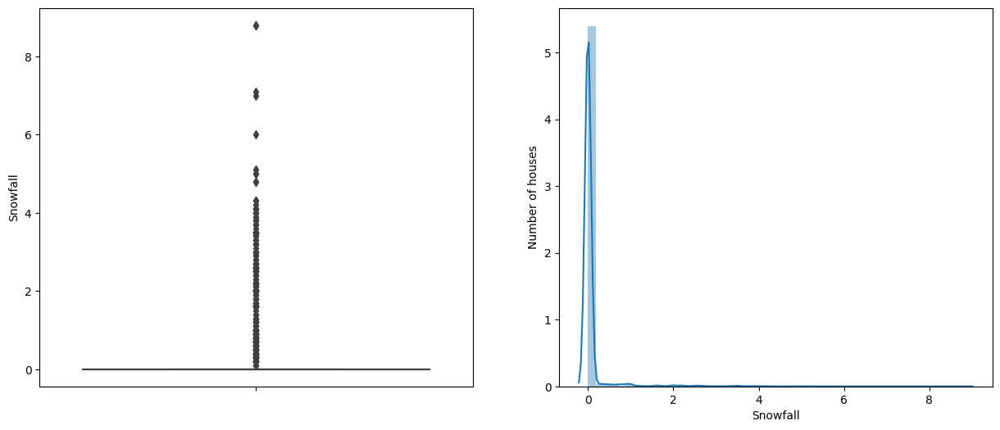

In [ ]:
# ploting box plot for checking the outliers.
for var in continuous:
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    fig = sb.boxplot(y=A[var])
    fig.set_title('')
    fig.set_ylabel(var)

    plt.subplot(1, 2, 2)
    fig = sb.distplot(A[var].dropna())
    fig.set_ylabel('Number of houses')
    fig.set_xlabel(var)

    plt.show()

In our data "Snowfall", "Rainfall", "Solar_Radiation", and  "Wind_speed" columns has Outlier.

In [ ]:
A[["Solar_Radiation"]].value_counts()

Solar_Radiation
0.00               4300
0.01                128
0.02                 82
0.03                 69
0.06                 61
                   ... 
3.38                  1
2.97                  1
3.44                  1
3.45                  1
3.49                  1
Length: 345, dtype: int64

In [ ]:
# #Capping the outlier rows with Percentiles
# Calculate the upper and lower limits
Q1 = A['Solar_Radiation'].quantile(0.25)
Q3 = A['Solar_Radiation'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR

A.loc[(A["Solar_Radiation"] > upper),"Solar_Radiation"] = upper
A.loc[(A["Solar_Radiation"] < lower),"Solar_Radiation"] = lower

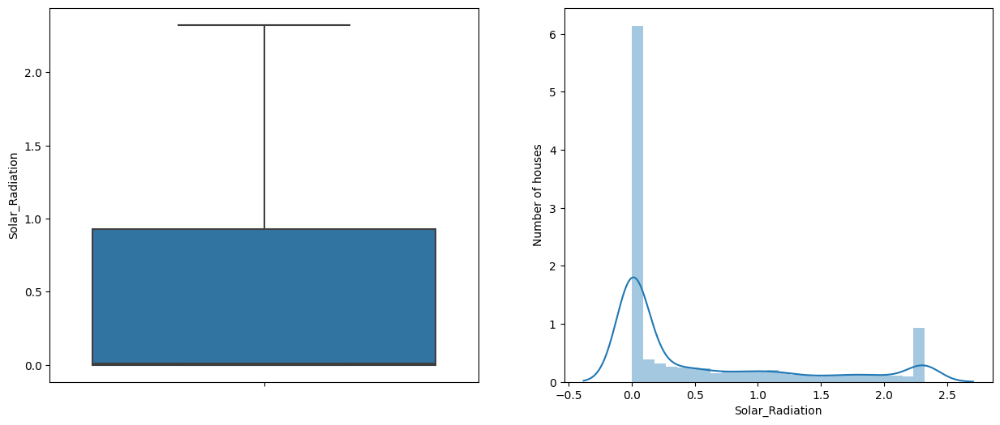

In [ ]:
plt.figure(figsize=(15,6))
plt.subplot(1, 2, 1)
fig = sb.boxplot(y=A["Solar_Radiation"])
fig.set_title('')
fig.set_ylabel("Solar_Radiation")

plt.subplot(1, 2, 2)
fig = sb.distplot(A["Solar_Radiation"].dropna())
fig.set_ylabel('Number of houses')
fig.set_xlabel("Solar_Radiation")

plt.show()

In [ ]:
A[["Wind_speed"]].value_counts()

Wind_speed
1.1           420
1.2           403
1.0           388
0.9           388
0.8           385
             ... 
6.7             1
6.9             1
7.2             1
7.3             1
7.4             1
Length: 65, dtype: int64

In [ ]:
# #Capping the outlier rows with Percentiles
# Calculate the upper and lower limits
Q1 = A['Wind_speed'].quantile(0.25)
Q3 = A['Wind_speed'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR

A.loc[(A["Wind_speed"] > upper),"Wind_speed"] = upper
A.loc[(A["Wind_speed"] < lower),"Wind_speed"] = lower

In [ ]:
A[["Rainfall"]].value_counts()

Rainfall
0.0         8232
0.5          116
1.0           66
1.5           56
0.1           46
            ... 
2.4            1
1.3            1
1.9            1
1.8            1
35.0           1
Length: 61, dtype: int64

In [ ]:
A.loc[A["Rainfall"]>=3,"Rainfall"]=3

In [ ]:
A[["Snowfall"]].value_counts()

Snowfall
0.0         8317
0.3           42
1.0           39
0.5           34
0.9           34
0.7           31
0.8           22
2.0           22
0.4           21
1.6           19
2.2           18
0.2           15
0.6           15
3.5           14
2.6           12
2.5           10
1.2            8
2.7            6
1.8            5
3.0            5
3.2            4
1.3            4
4.0            4
4.1            4
1.1            3
1.7            3
3.3            3
3.7            3
2.4            3
2.3            3
2.1            3
1.9            3
3.8            3
4.3            2
4.8            2
5.0            2
3.9            2
8.8            2
3.4            2
2.9            2
2.8            2
0.1            2
1.4            2
3.6            1
3.1            1
4.2            1
5.1            1
6.0            1
7.0            1
7.1            1
1.5            1
dtype: int64

In [ ]:
A.loc[A["Snowfall"]>=2,"Snowfall"]=2

Normalise Rented_Bike_count column data

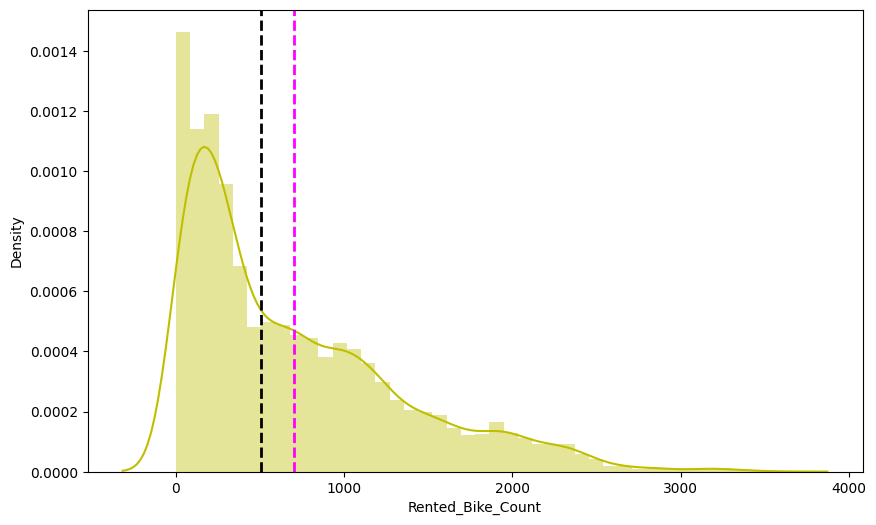

In [ ]:
#Distribution plot of Rented Bike Count
plt.figure(figsize=(10,6))
plt.xlabel("Rented_Bike_Count")
plt.ylabel("Density")
ax=sb.distplot(A["Rented_Bike_Count"],hist=True,color="y")
ax.axvline(A["Rented_Bike_Count"].mean(),color="magenta",linestyle="dashed",linewidth=2)
ax.axvline(A["Rented_Bike_Count"].median(),color="black",linestyle="dashed",linewidth=2)
plt.show()


the above graph shows that, Rented_Bike_Count has moderate right skewness. Since the assumption of linear regression is that "the distribution of dependent variable has to be normal",so we should perform some operation to make it nornal.

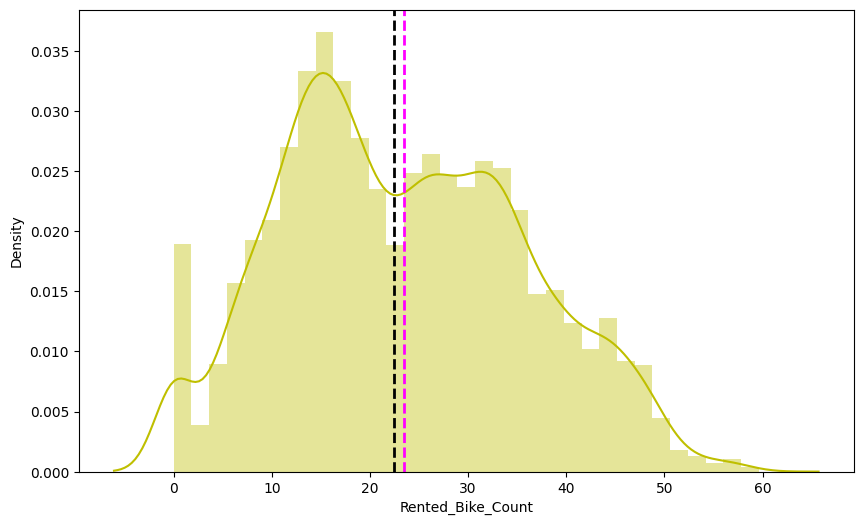

In [ ]:
#Applying square root to Rented Bike Count to improve skewness
plt.figure(figsize=(10,6))
plt.xlabel("Rented_Bike_Count")
plt.ylabel("Density")
ax=sb.distplot(np.sqrt(A["Rented_Bike_Count"]),color="y")
ax.axvline(np.sqrt(A["Rented_Bike_Count"]).mean(),color="magenta",linestyle="dashed",linewidth=2)
ax.axvline(np.sqrt(A["Rented_Bike_Count"]).median(),color="black",linestyle="dashed",linewidth=2)
plt.show()

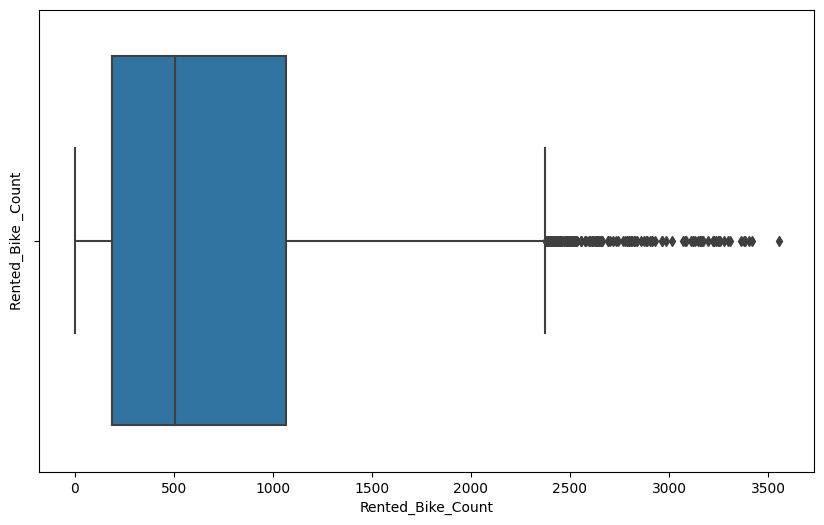

In [ ]:
#Boxplot for Rented_Bike_Count to check outliers
plt.figure(figsize=(10,6))
plt.ylabel("Rented_Bike _Count")
sb.boxplot(x=A["Rented_Bike_Count"])
plt.show()

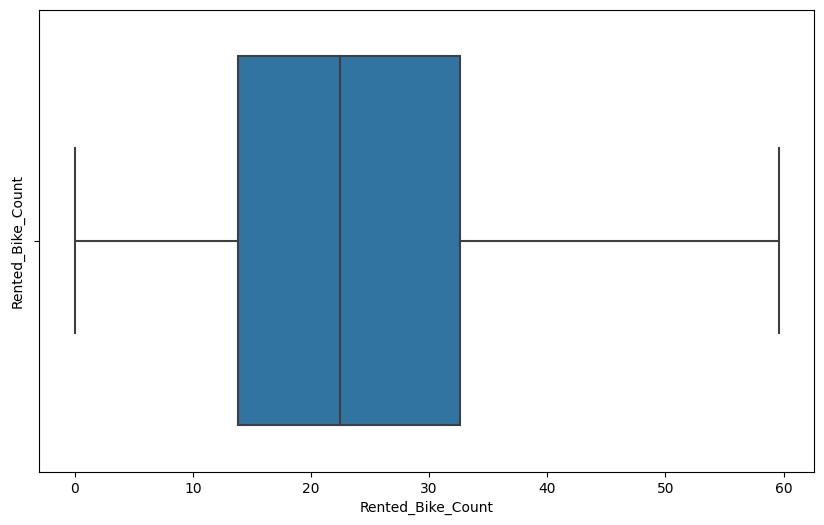

In [ ]:
#After applying sqrt on Rented_Bike_Count check wheater we still have outliers
plt.figure(figsize=(10,6))
plt.ylabel("Rented_Bike_Count")
sb.boxplot(x=np.sqrt(A["Rented_Bike_Count"]))
plt.show()


After applying square root to the rented Bike count column, we find that there is no outliers present.

### 3. Categorical Encoding

In [ ]:
# Define X and Y
Y=np.sqrt(A[["Rented_Bike_Count"]])

In [ ]:
X=A.drop(labels=["Rented_Bike_Count"],axis=1)

In [ ]:
# dividing the data into categorical and continuous
cat=[]
con=[]

In [ ]:
for i in X.columns:
    if(X[i].dtype=="object"):
      cat.append(i)
    else:
      con.append(i)

In [ ]:
X[cat].columns

Index(['Hour', 'Seasons', 'Holiday', 'Functioning_Day', 'month',
       'weekday_weekend'],
      dtype='object')

In [ ]:
X[con].columns

Index(['Temperature', 'Humidity', 'Wind_speed', 'Visibility',
       'Dew_point_temperature', 'Solar_Radiation', 'Rainfall', 'Snowfall'],
      dtype='object')

In [ ]:
# Encode your categorical columns

Xcat_B=pd.get_dummies(X[cat])

### 4. Dimesionality Reduction

In [ ]:
# Applying VIF for finding multicolinearity in our data

from statsmodels.stats.outliers_influence import variance_inflation_factor

def cal_vif(x):
  vif=pd.DataFrame()
  vif["variable"]=x.columns
  vif["vif"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
  return(vif)

In [ ]:
cal_vif(X[[i for i in X.describe().columns]])

,variable,vif
0,Temperature,29.394106
1,Humidity,5.372423
2,Wind_speed,4.712743
3,Visibility,9.122004
4,Dew_point_temperature,15.369226
5,Solar_Radiation,2.919439
6,Rainfall,1.186924
7,Snowfall,1.153519


If vif value grater then 10, its mean column has highly correleted with other columns.

In [ ]:
X=X.drop(labels=["Dew_point_temperature"],axis=1)

In [ ]:
cal_vif(X[[i for i in X.describe().columns]])

,variable,vif
0,Temperature,3.227504
1,Humidity,5.066404
2,Wind_speed,4.255813
3,Visibility,4.574277
4,Solar_Radiation,2.322122
5,Rainfall,1.183653
6,Snowfall,1.153519


Now all the column's vif value less then 10.

Applying VIF(variance_inflation_factor) is important because it will remove multicollinearity from our independ variables.

When multicollinearity is present, the estimated regression coefficients may become large and unpredictable, leading to unreliable inferences about the effects of the predictor variables on the response variable. Therefore, it is important to check for multicollinearity and consider using other regression techniques that can handle this problem

### 5. Data Scaling

In [ ]:
# dividing the data into categorical and continuous
cat=[]
con=[]

In [ ]:
for i in X.columns:
    if(X[i].dtype=="object"):
      cat.append(i)
    else:
      con.append(i)

In [ ]:
X[con].columns

Index(['Temperature', 'Humidity', 'Wind_speed', 'Visibility',
       'Solar_Radiation', 'Rainfall', 'Snowfall'],
      dtype='object')

In [ ]:
# Scaling our continuous_data by applying Standardscaler.

from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
Xcon_std=pd.DataFrame(ss.fit_transform(X[con]),columns=X[con].columns)


In [ ]:
# Merge our Scaling continuous_columns and Encode categorical_columns

X=Xcon_std.join(Xcat_B)

### 6. Data Splitting

In [ ]:
# Split your data to train and test. Choose Splitting ratio wisely.

from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.2,random_state=21)


We split our data into 80% training amd 20% testing.

The train-test split is used to estimate the performance of machine learning algorithms that are applicable for prediction-based Algorithms/Applications. This method is a fast and easy procedure to perform such that we can compare our own machine learning model results to machine results.

## ***7. ML Model Implementation***

# ML Model - 1

## LinearRegression

In [ ]:
#Import library for LinearRegression
from sklearn.linear_model import LinearRegression
lr=LinearRegression()

# Fit the Algorithm
model_lr=lr.fit(xtrain,ytrain)

# Predict on the model
pred_test=model_lr.predict(xtest)
pred_train=model_lr.predict(xtrain)


In [ ]:
#check coefficents
model_lr.coef_

array([[ 5.66708661e+00, -2.07920141e+00,  1.32549639e-02,
         3.82280721e-01,  7.67572241e-01, -2.64691086e+00,
        -6.92579139e-02, -3.85240017e+11, -3.85240017e+11,
        -3.85240017e+11, -3.85240017e+11, -3.85240017e+11,
        -3.85240017e+11, -3.85240017e+11, -3.85240017e+11,
        -3.85240017e+11, -3.85240017e+11, -3.85240017e+11,
        -3.85240017e+11, -3.85240017e+11, -3.85240017e+11,
        -3.85240017e+11, -3.85240017e+11, -3.85240017e+11,
        -3.85240017e+11, -3.85240017e+11, -3.85240017e+11,
        -3.85240017e+11, -3.85240017e+11, -3.85240017e+11,
        -3.85240017e+11, -3.66360713e+12, -1.59796694e+12,
        -7.79214506e+12, -4.70736091e+12, -1.95947714e+11,
        -1.95947714e+11, -5.06248419e+11, -5.06248419e+11,
        -1.30662576e+11, -1.30662576e+11, -3.24005654e+12,
        -3.24005654e+12, -3.24005654e+12,  2.95412158e+12,
         2.95412158e+12,  2.95412158e+12, -1.17441635e+12,
        -1.17441635e+12, -1.17441635e+12, -1.30662576e+1

In [ ]:
#import the packages for Evaluation metric
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score

In [ ]:
#calculate Evaluation metric for training data
MSE  = mean_squared_error(ytrain, pred_train)
print("MSE :" , MSE)

#calculate root mean squared error for training data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for training data
MAE=mean_absolute_error(ytrain, pred_train)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for training data
r2 = r2_score(ytrain, pred_train)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytrain, pred_train))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytrain, pred_train))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 31.594308368351356
RMSE : 5.6208814583080615
MAE : 4.269755303630341
R2 : 0.7961868640440696
Adjusted R2 : 0.7898252055012756


Looks like our train set's r2_score valuue is 0.79 that means our model is able to capture most of the data variance. Let's save it in a dataframe for later comparision.

In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict1={"Model":"Linear regression",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
training_df=pd.DataFrame(dict1,index=[1])

In [ ]:
#calculate Evaluation metric for testing data
MSE  = mean_squared_error(ytest, pred_test)
print("MSE :" , MSE)

#calculate root mean squared error for testing data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for testing data
MAE=mean_absolute_error(ytest, pred_test)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for testing data
r2 = r2_score(ytest, pred_test)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytest, pred_test))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 : ",1-(1-r2_score(ytest, pred_test))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 30.510763583731304
RMSE : 5.523654911716635
MAE : 4.267634073474145
R2 : 0.8031309376251756
Adjusted R2 :  0.7969860257842654


The test set's R2_score 0.80. This means our linear model is performing well on the data.

In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict2={"Model":"Linear regression",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
test_df=pd.DataFrame(dict2,index=[1])

In [ ]:
# Define a function to plot scatterplot for y_test and y_actual.
def plot_scatter(y_test,y_pred):
  """plot scatter plot for y_test values and y_predicted value. to check how close we are to regression line."""

  plt.figure(figsize=(16,5))
  sb.regplot(x=ytest , y=pred_test, scatter_kws={"color":"magenta"}, line_kws={"color":"black"})
  plt.xlabel("Actual")
  plt.ylabel("Predicted")
  plt.title("Actual vs predicted")
  plt.show()

In [ ]:
# Actual vs predicted for linear regression plot
def plot_pred_vs_actual(y_test, y_predict):
  """ visualize predicted values with actual values"""

  plt.figure(figsize=(16,8))
  plt.plot(pred_test)
  plt.plot(np.array(pred_test))
  plt.legend(["Predicted","Actual"])
  plt.xlabel("No. of test Data")
  plt.show()

In [ ]:
# Residuals of the regression are normally distributed.
def residual_distplot(y_test, y_predict):
  """Checks the distribution of residual"""

  plt.figure(figsize=(10,5))
  sb.distplot(x=ytest-pred_test)
  plt.title("residual Distribution")
  plt.show()

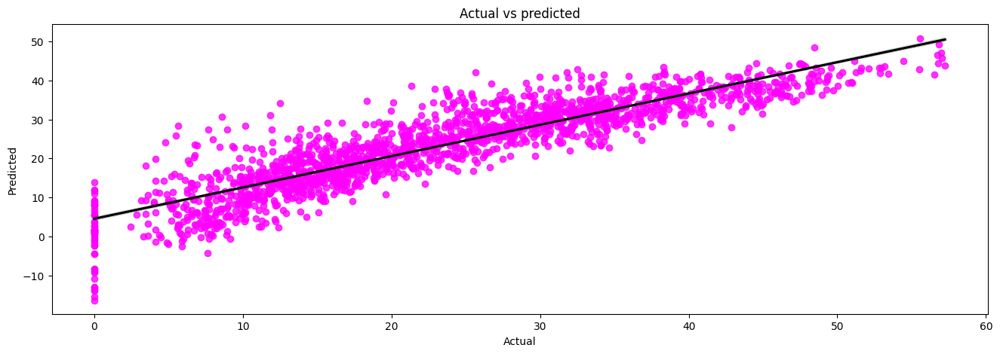

In [ ]:
# Define a function to plot scatterplot for y_test and y_actual.
plot_scatter(ytest,pred_test)

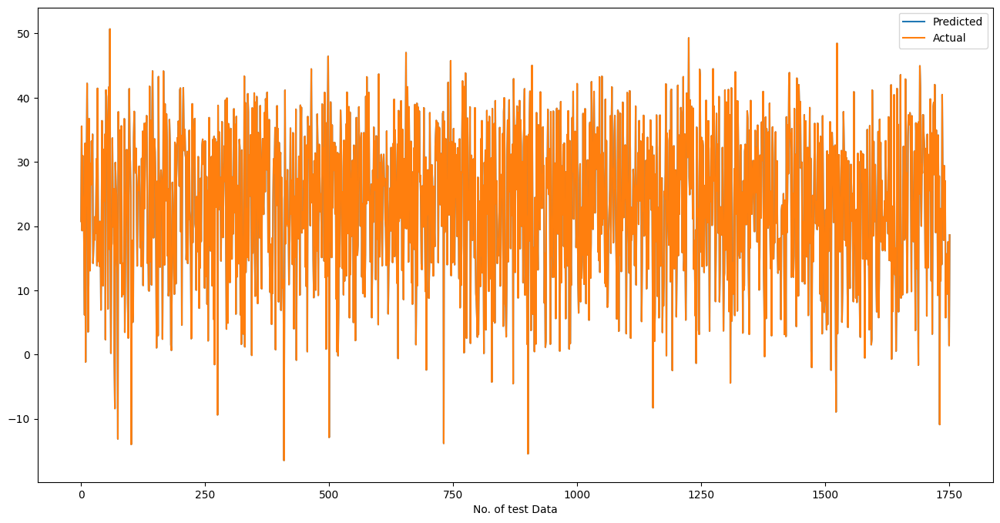

In [ ]:
# Actual vs predicted for linear regression plot
plot_pred_vs_actual(ytest,pred_test)

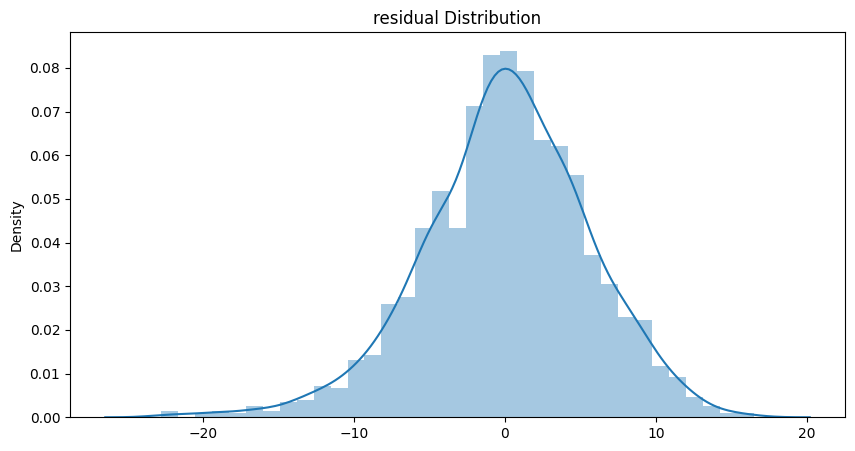

In [ ]:
# Residuals of the regression are normally distributed.
residual_distplot(ytest,pred_test)

## Ridge and Lasso Regression



*   Ridge and Lasso Regression are type of Regularization techniques.

*   Regularization techniques are used to deal with overfitting and when the dataset is large.
*   Ridge and Lasso Regression involve adding penalties to the regression function.



## Lasso Regression


Lasso regression analysis is shrinkage and variable section method of linear regression model. The goal of the lasso regression is to obtain the subset of predictors that minimizes prediction error for quantitative response variable. It used to Linear regression model with L1 regression.

In [ ]:
#Import library for Lasso
from sklearn.linear_model import Lasso
La=Lasso()

# Import library for GridSearch CV
from sklearn.model_selection import GridSearchCV

# Apllying hyperparameter tuning for best value for lapha.

grid_values = {'alpha':[0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1]}
cv = GridSearchCV(La, param_grid = grid_values, scoring = 'neg_mean_absolute_error', cv=5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval

{'alpha': 0.01}

In [ ]:
# Fit the Algorithm for Lasso
from sklearn.linear_model import Lasso
La=Lasso(alpha=0.01)
model_La=La.fit(xtrain,ytrain)

# Predict on the model
pred_train_La=model_La.predict(xtrain)
pred_test_La=model_La.predict(xtest)

In [ ]:
#calculate Evaluation metric for training data
MSE  = mean_squared_error(ytrain, pred_train_La)
print("MSE :" , MSE)

#calculate root mean squared error for training data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for training data
MAE=mean_absolute_error(ytrain, pred_train_La)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for training data
r2 = r2_score(ytrain, pred_train_La)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytrain, pred_train_La))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytrain, pred_train_La))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 31.701797180981966
RMSE : 5.630434901584598
MAE : 4.278953329105852
R2 : 0.7954934596584755
Adjusted R2 : 0.7891101577514668


Looks like our train set's r2_score valuue is 0.79 that means our model is able to capture most of the data variance. Let's save it in a dataframe for later comparision.

In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict1={"Model":"Lasso regression",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
training_df=training_df.append(dict1,ignore_index=True)

In [ ]:
#calculate Evaluation metric for testing data
MSE  = mean_squared_error(ytest, pred_test_La)
print("MSE :" , MSE)

#calculate root mean squared error for testing data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for testing data
MAE=mean_absolute_error(ytest, pred_test_La)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for testing data
r2 = r2_score(ytest, pred_test_La)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytest, pred_test_La))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytest, pred_test_La))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 30.650865728641342
RMSE : 5.536322401074683
MAE : 4.2777365662137194
R2 : 0.8022269360642363
Adjusted R2 : 0.7960538074490446


The test set's R2_score 0.80. This means our Lasso model is performing well on the data.

In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict2={"Model":"Lasso regression",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
test_df=test_df.append(dict2,ignore_index=True)

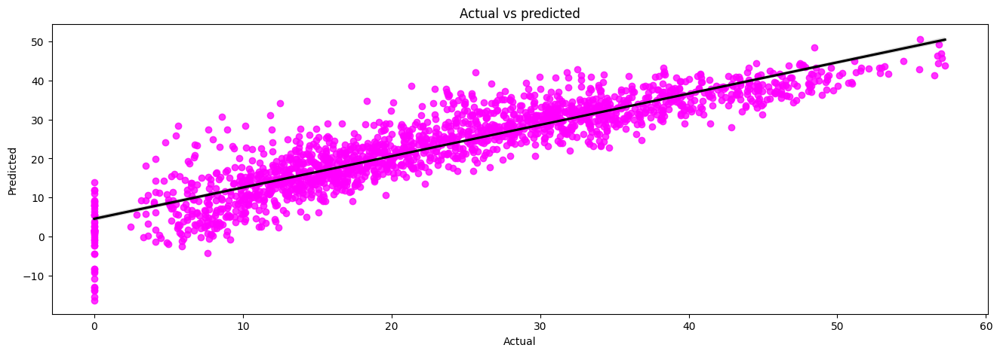

In [ ]:
# Define a function to plot scatterplot for y_test and y_actual.
plot_scatter(ytest, pred_test_La)

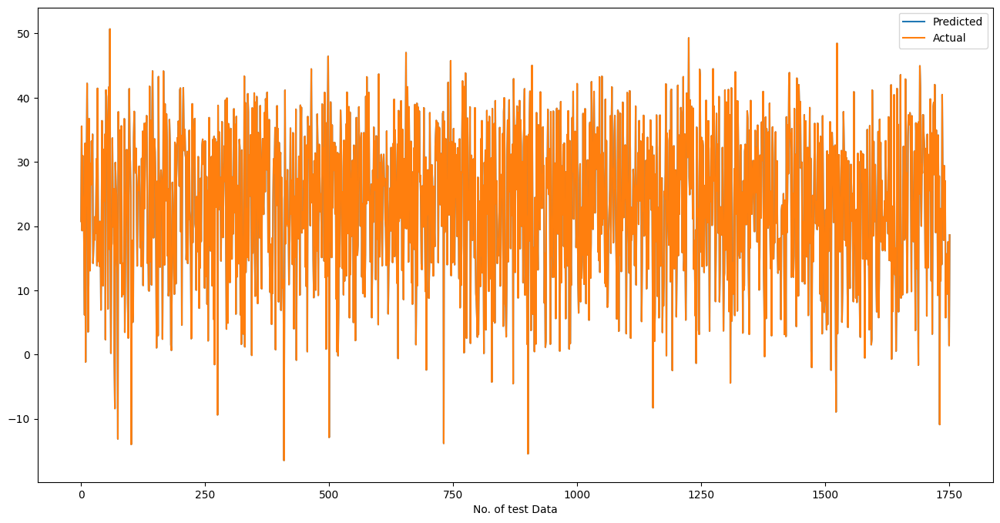

In [ ]:
# Actual vs predicted for linear regression plot
plot_pred_vs_actual(ytest, pred_test_La)

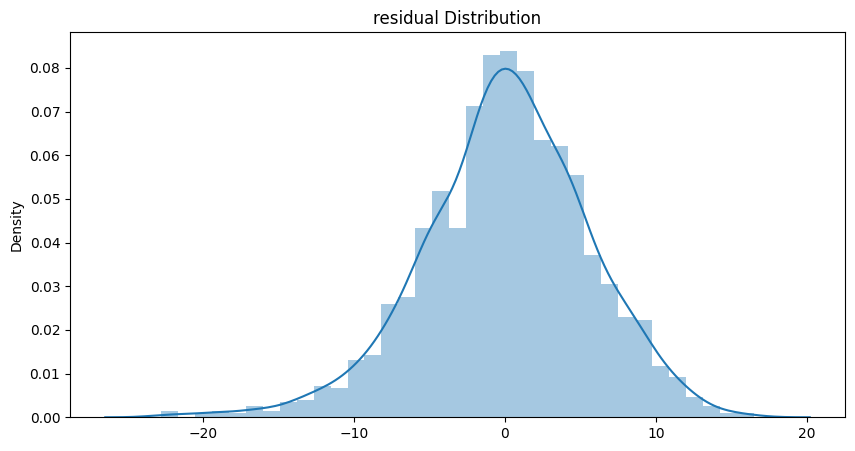

In [ ]:
# Residuals of the regression are normally distributed.
residual_distplot(ytest, pred_test_La)

## Ridge Regression

Ridge regression is a method of estimating the coefficient of regression model in scenario where the independent variable highly correlated. It used in linear regression model with the L2 regression method.

In [ ]:
#Import library for Ridge
from sklearn.linear_model import Ridge
Ri=Ridge()

# Apllying hyperparameter tuning for best value for lapha.

grid_values = {'alpha':[0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1]}
cv = GridSearchCV(Ri, param_grid = grid_values, scoring = 'neg_mean_absolute_error', cv=5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval

{'alpha': 0.01}

In [ ]:
# Fit the Algorithm for Lasso
Ri=Ridge(alpha=0.01)
model_Ri=Ri.fit(xtrain,ytrain)

# Predict on the model
pred_train_Ri=model_Ri.predict(xtrain)
pred_test_Ri=model_Ri.predict(xtest)

In [ ]:
#calculate Evaluation metric for training data
MSE  = mean_squared_error(ytrain, pred_train_Ri)
print("MSE :" , MSE)

#calculate root mean squared error for training data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for training data
MAE=mean_absolute_error(ytrain, pred_train_Ri)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for training data
r2 = r2_score(ytrain, pred_train_Ri)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytrain, pred_train_Ri))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytrain, pred_train_Ri))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 31.594266989559788
RMSE : 5.620877777497015
MAE : 4.269634392741512
R2 : 0.7961871309763655
Adjusted R2 : 0.7898254807653804


Looks like our train set's r2_score valuue is 0.79 that means our model is able to capture most of the data variance. Let's save it in a dataframe for later comparision.

In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict1={"Model":"Ridge regression",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
training_df=training_df.append(dict1,ignore_index=True)

In [ ]:
#calculate Evaluation metric for testing data
MSE  = mean_squared_error(ytest, pred_test_Ri)
print("MSE :" , MSE)

#calculate root mean squared error for testing data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for testing data
MAE=mean_absolute_error(ytest, pred_test_Ri)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for testing data
r2 = r2_score(ytest, pred_test_Ri)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytest, pred_test_Ri))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 : ",1-(1-r2_score(ytest, pred_test_Ri))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 30.51062738792323
RMSE : 5.523642583288969
MAE : 4.267554132983354
R2 : 0.803131816421308
Adjusted R2 :  0.7969869320104301


The test set's R2_score 0.80. This means our Ridge model is performing well on the data.

In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict2={"Model":"Ridge regression",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
test_df=test_df.append(dict2,ignore_index=True)

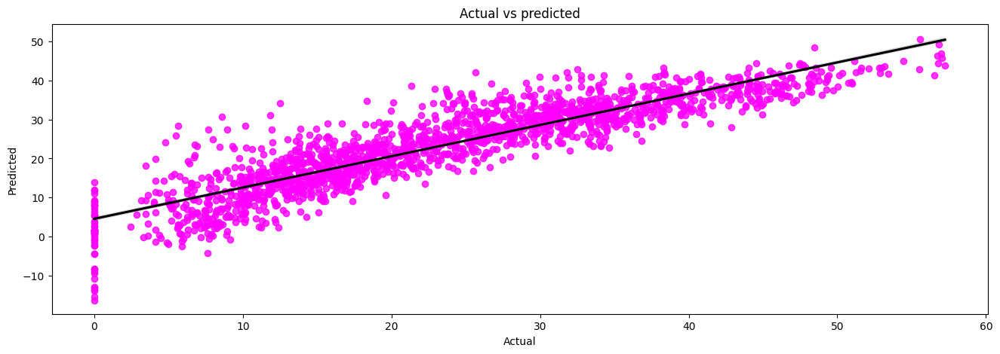

In [ ]:
# Define a function to plot scatterplot for y_test and y_actual.
plot_scatter(ytest, pred_test_Ri)

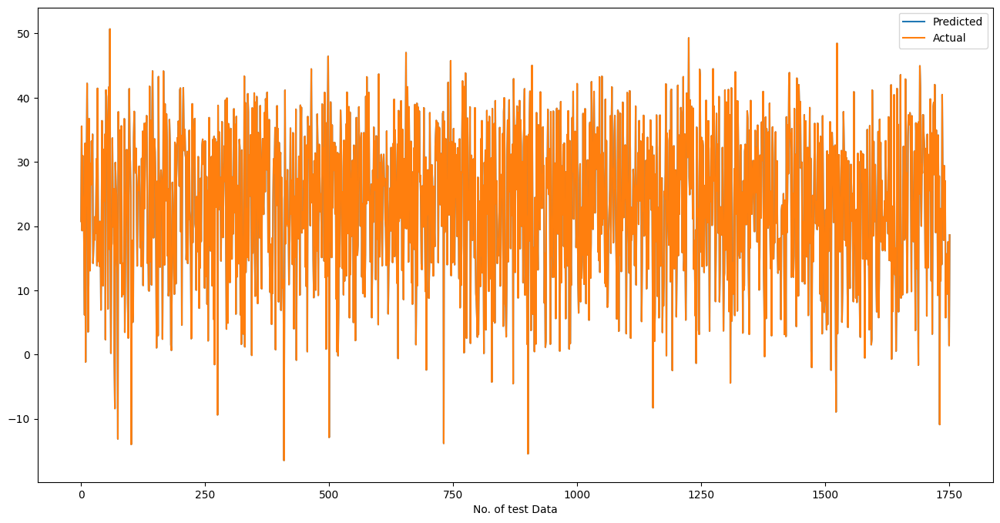

In [ ]:
# Actual vs predicted for linear regression plot
plot_pred_vs_actual(ytest, pred_test_Ri)

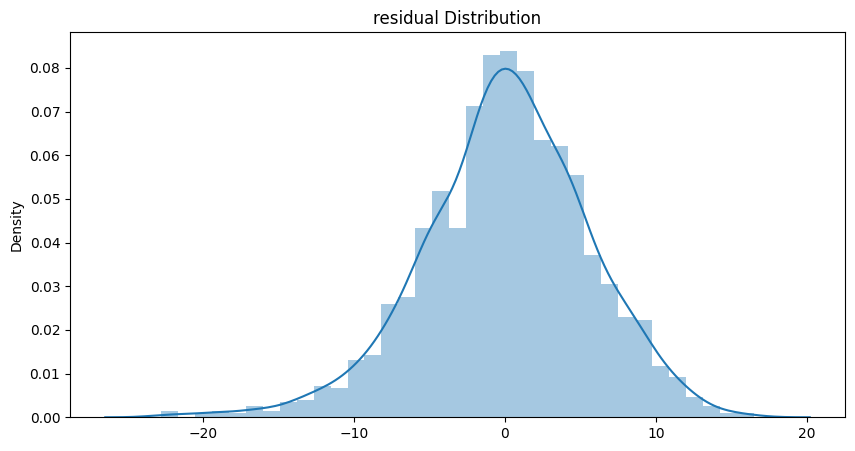

In [ ]:
# Residuals of the regression are normally distributed.
residual_distplot(ytest, pred_test_Ri)

## ELASTIC NET REGRESSION

In [ ]:
# import the packages
from sklearn.linear_model import ElasticNet
# a + L1 + b * L2
# alpha = a + b and l1_ratio = a / (a + b)

In [ ]:
#Import library for ElasticNet
from sklearn.linear_model import ElasticNet
elasticnet=ElasticNet()

# Apllying hyperparameter tuning for best value for lapha.

grid_values = {'alpha':[0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1]}
cv = GridSearchCV(elasticnet, param_grid = grid_values, scoring = 'neg_mean_absolute_error', cv=5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval

{'alpha': 0.01}

In [ ]:
# Fit the Algorithm for ElasticNet
elasticnet=ElasticNet(alpha=0.01,l1_ratio=0.5)
model_elas=elasticnet.fit(xtrain,ytrain)

In [ ]:
# Predict the model
pred_test_elas=model_elas.predict(xtest)
pred_train_elas=model_elas.predict(xtrain)

In [ ]:
#calculate Evaluation metric for training data
MSE  = mean_squared_error(ytrain, pred_train_elas)
print("MSE:" , MSE)

#calculate root mean squared error for training data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for training data
MAE=mean_absolute_error(ytrain, pred_train_elas)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for training data
r2 = r2_score(ytrain, pred_train_elas)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytrain, pred_train_elas))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytrain, pred_train_elas))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE: 32.260813847534806
RMSE : 5.679860372186521
MAE : 4.338398216179271
R2 : 0.7918872740590498
Adjusted R2 : 0.7853914115885725


Looks like our train set's r2_score valuue is 0.79 that means our model is able to capture most of the data variance. Let's save it in a dataframe for later comparision.

In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict1={"Model":"Elastic Net Regression",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
training_df=training_df.append(dict1,ignore_index=True)

In [ ]:
#calculate Evaluation metric for testing data
MSE  = mean_squared_error(ytest, pred_test_elas)
print("MSE :" , MSE)

#calculate root mean squared error for testing data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for testing data
MAE=mean_absolute_error(ytest, pred_test_elas)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for testing data
r2 = r2_score(ytest, pred_test_elas)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytest, pred_test_elas))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytest, pred_test_elas))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 31.400135940200187
RMSE : 5.603582420220139
MAE : 4.359744676220092
R2 : 0.7973923102899529
Adjusted R2 : 0.7910682775722659


The test set's R2_score 0.79, This means our linear model is performing well on the data.

In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict2={"Model":"Elastic Net Regression",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
test_df=test_df.append(dict2,ignore_index=True)

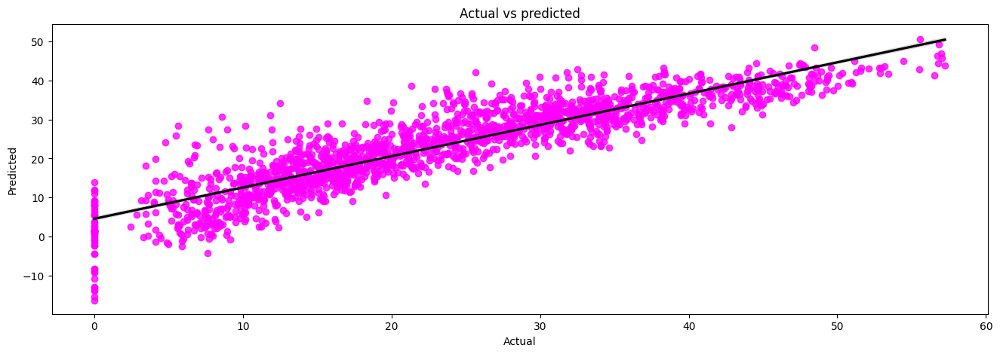

In [ ]:
# Define a function to plot scatterplot for y_test and y_actual.
plot_scatter(ytest, pred_test_elas)

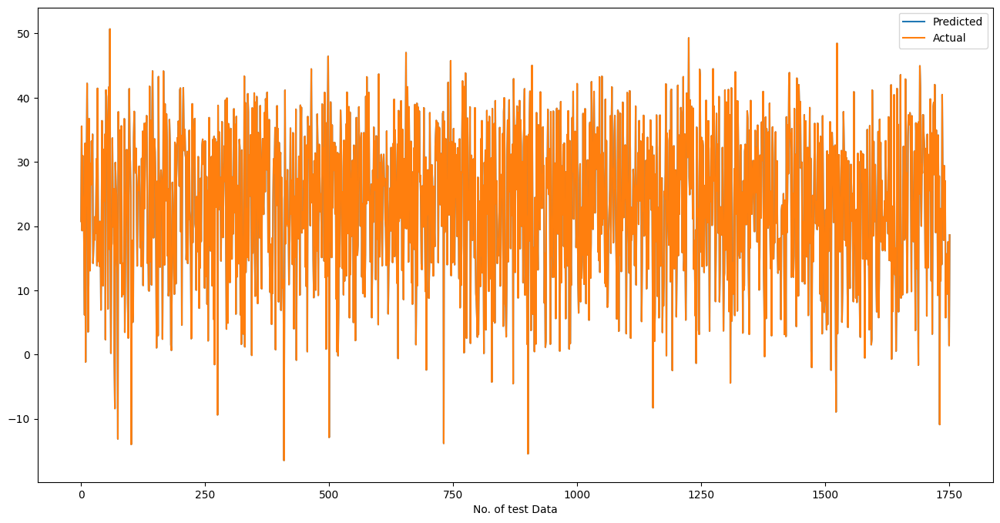

In [ ]:
# Actual vs predicted for linear regression plot
plot_pred_vs_actual(ytest, pred_test_elas)

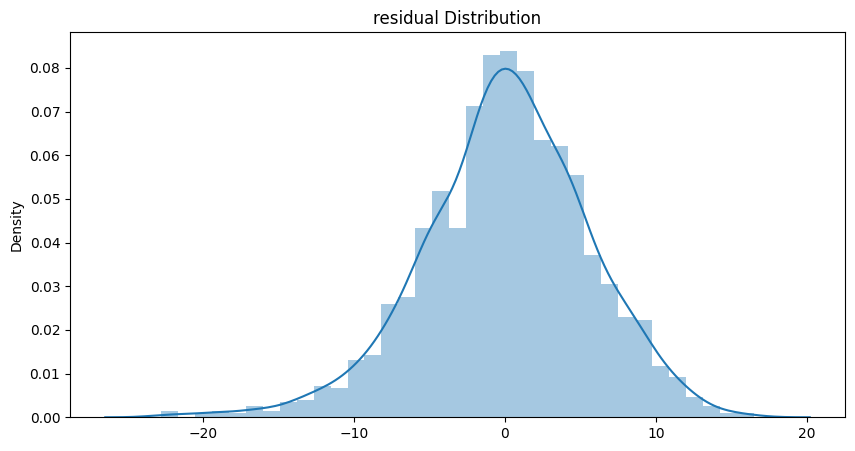

In [ ]:
# Residuals of the regression are normally distributed.
residual_distplot(ytest, pred_test_elas)

# ML Model - 2

## Decision Tree Regression

In [ ]:
#Import library for Decision Tree Regression
from sklearn.tree import DecisionTreeRegressor
dtr=DecisionTreeRegressor()

# Fit the Algorithm
decision_tree_regressor_model=dtr.fit(xtrain,ytrain)

# Predict on the model
pred_train_decision_tree=decision_tree_regressor_model.predict(xtrain)
pred_test_decision_tree=decision_tree_regressor_model.predict(xtest)

In [ ]:
#calculate Evaluation metric for training data
MSE  = mean_squared_error(ytrain, pred_train_decision_tree)
print("MSE:" , MSE)

#calculate root mean squared error for training data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for training data
MAE=mean_absolute_error(ytrain, pred_train_decision_tree)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for training data
r2 = r2_score(ytrain, pred_train_decision_tree)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytrain, pred_train_decision_tree))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytrain, pred_train_decision_tree))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE: 0.0
RMSE : 0.0
MAE : 0.0
R2 : 1.0
Adjusted R2 : 1.0


Looks like our train set's r2_score valuue is 1, and mean_square_error(mse) value is 0.

In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict1={"Model":"Decision Tree Regressor",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
training_df=training_df.append(dict1,ignore_index=True)

In [ ]:
#calculate Evaluation metric for testing data
MSE  = mean_squared_error(ytest, pred_test_decision_tree)
print("MSE :" , MSE)

#calculate root mean squared error for testing data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for testing data
MAE=mean_absolute_error(ytest, pred_test_decision_tree)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for testing data
r2 = r2_score(ytest, pred_test_decision_tree)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytest, pred_test_decision_tree))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytest, pred_test_decision_tree))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 23.867011979393954
RMSE : 4.885387597662437
MAE : 2.9023378919630973
R2 : 0.8459993878167842
Adjusted R2 : 0.841192537142043


The test set's R2_score 0.84, This means our Decision tree model is not  performing well on the data. The model is overfitted. We will apply Hyperparameter tuning to miprove the model and reduce the overfitting problem.

In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict2={"Model":"decision tree Regression",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
test_df=test_df.append(dict2,ignore_index=True)

In [ ]:
result=pd.concat([training_df, test_df], keys=["Training_set","Testing_set"])
print(result)

                                   Model    MAE     MSE   RMSE     R2  \
Training_set 0         Linear regression  4.270  31.594  5.621  0.796   
             1          Lasso regression  4.279  31.702  5.630  0.795   
             2          Ridge regression  4.270  31.594  5.621  0.796   
             3    Elastic Net Regression  4.338  32.261  5.680  0.792   
             4   Decision Tree Regressor  0.000   0.000  0.000  1.000   
Testing_set  0         Linear regression  4.268  30.511  5.524  0.803   
             1          Lasso regression  4.278  30.651  5.536  0.802   
             2          Ridge regression  4.268  30.511  5.524  0.803   
             3    Elastic Net Regression  4.360  31.400  5.604  0.797   
             4  decision tree Regression  2.902  23.867  4.885  0.846   

                Adjusted R2  
Training_set 0        0.790  
             1        0.789  
             2        0.790  
             3        0.785  
             4        1.000  
Testing_set  0  

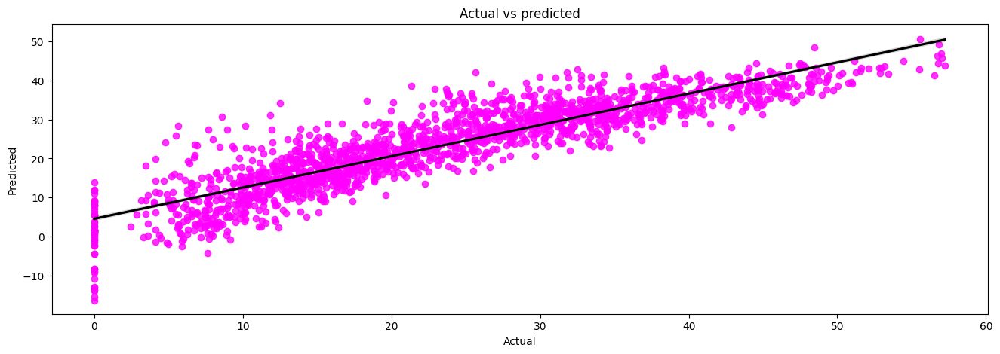

In [ ]:
# Define a function to plot scatterplot for y_test and y_actual.
plot_scatter(ytest, pred_test_decision_tree)

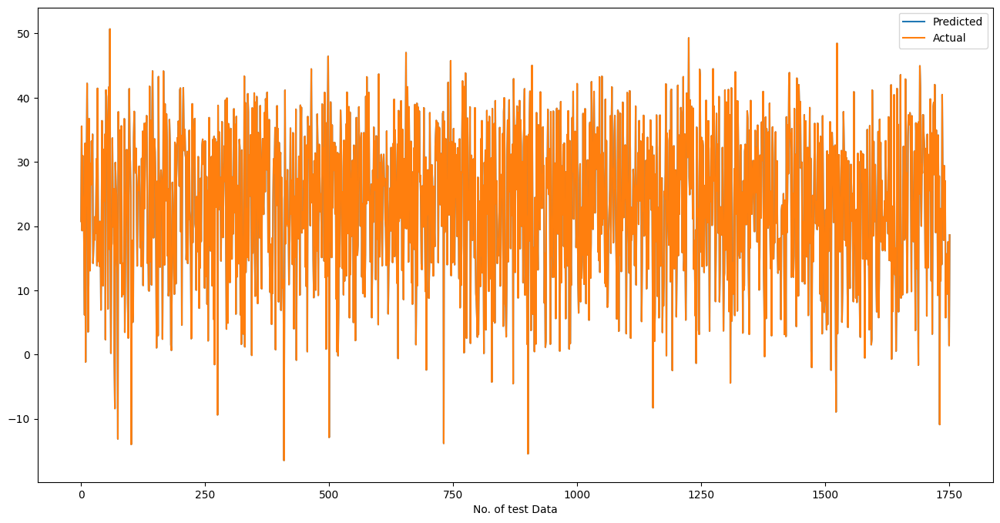

In [ ]:
# Actual vs predicted for linear regression plot
plot_pred_vs_actual(ytest, pred_test_decision_tree)

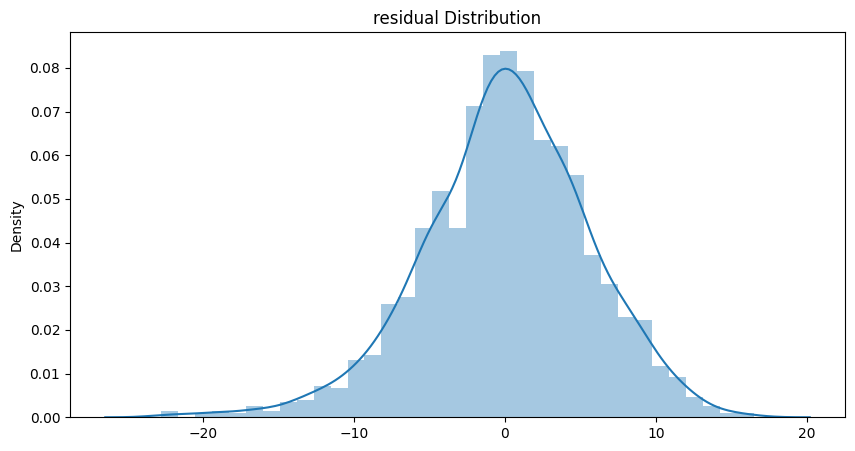

In [ ]:
# Residuals of the regression are normally distributed.
residual_distplot(ytest, pred_test_decision_tree)

In [ ]:
#dtr=DecisionTreeRegressor(criterion='friedman_mse',max_leaf_nodes=53,random_state=21)

## Decision Tree with Hyperparameter Tuning

In [ ]:
#Import library for Decision Tree Regression
from sklearn.tree import DecisionTreeRegressor
dtr=DecisionTreeRegressor(random_state=21)

from sklearn.model_selection import GridSearchCV
grid_values = {'max_depth':list(range(1,31,1))}
cv = GridSearchCV(dtr, param_grid = grid_values, scoring = 'neg_mean_absolute_error', cv=5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval


{'max_depth': 25}

In [ ]:
from sklearn.tree import DecisionTreeRegressor

In [ ]:
# Fit the Algorithm
dtr=DecisionTreeRegressor(max_depth=20)

# Fit the Algorithm
decision_tree_regressor_model=dtr.fit(xtrain,ytrain)

# Predict on the model
pred_train_decision_tree=decision_tree_regressor_model.predict(xtrain)
pred_test_decision_tree=decision_tree_regressor_model.predict(xtest)

In [ ]:
#calculate Evaluation metric for training data
MSE  = mean_squared_error(ytrain, pred_train_decision_tree)
print("MSE:" , MSE)

#calculate root mean squared error for training data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for training data
MAE=mean_absolute_error(ytrain, pred_train_decision_tree)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for training data
r2 = r2_score(ytrain, pred_train_decision_tree)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytrain, pred_train_decision_tree))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytrain, pred_train_decision_tree))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE: 3.3614774654307777
RMSE : 1.833433245425308
MAE : 0.7293273226951363
R2 : 0.9783152947775577
Adjusted R2 : 0.9776384459101906


Looks like our train set's r2_score valuue is 0.97 and MSE is 3.3, that means our model is able to capture most of the data variance. Let's save it in a dataframe for later comparision.

In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict1={"Model":"Decision Tree Regressor Hyperparameter Tuning",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
training_df=training_df.append(dict1,ignore_index=True)

In [ ]:
#calculate Evaluation metric for testing data
MSE  = mean_squared_error(ytest, pred_test_decision_tree)
print("MSE :" , MSE)

#calculate root mean squared error for testing data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for testing data
MAE=mean_absolute_error(ytest, pred_test_decision_tree)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for testing data
r2 = r2_score(ytest, pred_test_decision_tree)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytest, pred_test_decision_tree))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytest, pred_test_decision_tree))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 24.22010432853351
RMSE : 4.921392519250371
MAE : 2.978641439935541
R2 : 0.8437210784091529
Adjusted R2 : 0.8388431144254574


The test set's R2_score 0.84 and MSE value is 24 This means our Decision Tree Hyperparameter model is performing well from our previous model but still there is a problem of overfitting.

In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict2={"Model":"Decision Tree Regressor Hyperparameter Tuning",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
test_df=test_df.append(dict2,ignore_index=True)

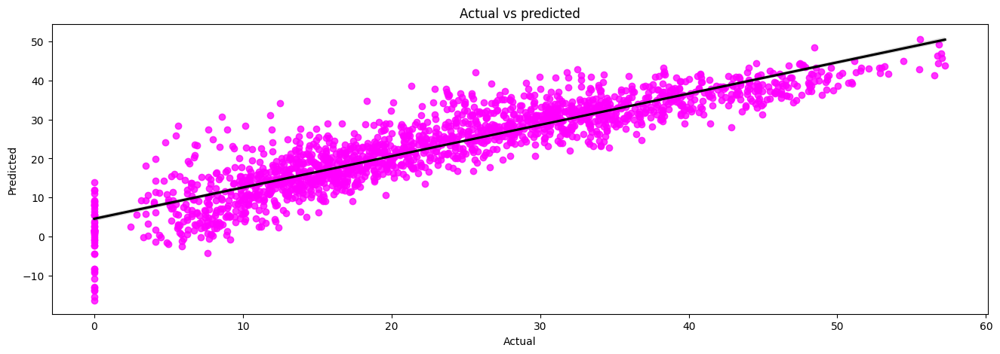

In [ ]:
# Define a function to plot scatterplot for y_test and y_actual.
plot_scatter(ytest, pred_test_decision_tree)

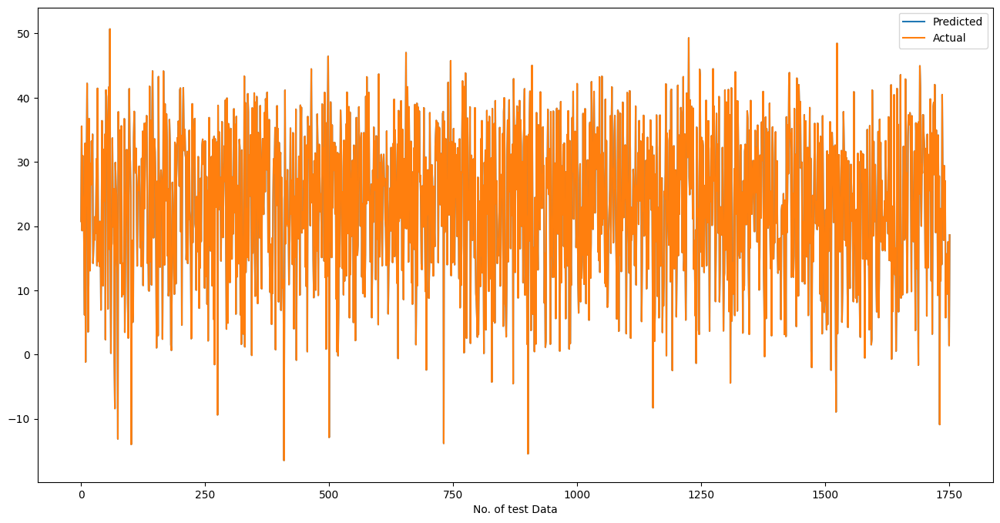

In [ ]:
# Actual vs predicted for linear regression plot
plot_pred_vs_actual(ytest, pred_test_decision_tree)

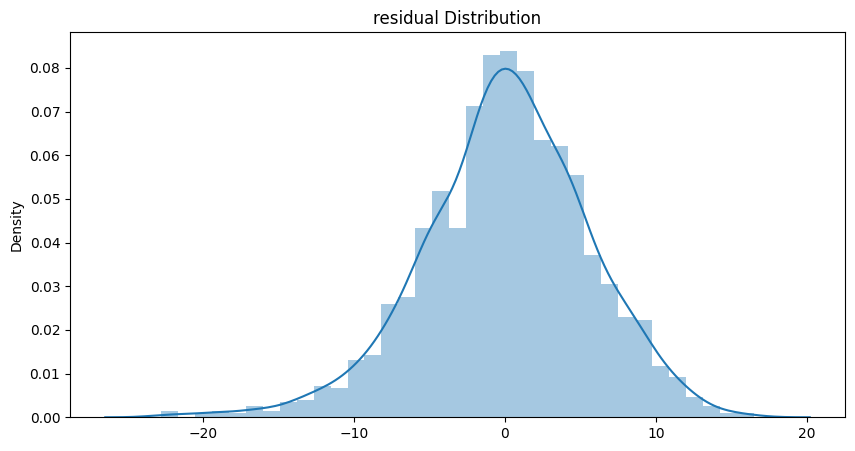

In [ ]:
# Residuals of the regression are normally distributed.
residual_distplot(ytest, pred_test_decision_tree)

##### Which hyperparameter optimization technique have you used and why?

I have used GridSearchCV hyperparameter optimization technique. GridSearchCV is a commonly used technique for hyperparameter tuning. It performs an exhaustive search over specified hyperparameter values for an estimator, and evaluates each combination using cross-validation. GridSearchCV helps to automate the process of parameter tuning, and helps to find the best combination of hyperparameters for the model, which in turn can improve its performance..

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Yes, there is an improvement in the overall performance of the model.  our Decision Tree Hyperparameter model is performing well from our previous model but still there is a problem of overfitting. mean_squared_error(MSE) fpr training set is 3 and test set mean_squared_error(MSE) is 24.

# ML Model - 3, Ensemble model

## Random Forest Regressor

In [ ]:
#Import library for LinearRegression
from sklearn.ensemble import RandomForestRegressor
rfr=RandomForestRegressor(random_state=21)

# Fit the Algorithm
random_forest_regressor_model=rfr.fit(xtrain,ytrain)

# Predict on the model
pred_test_random_forest=random_forest_regressor_model.predict(xtest)
pred_train_random_forest=random_forest_regressor_model.predict(xtrain)

In [ ]:
#calculate Evaluation metric for training data
MSE  = mean_squared_error(ytrain, pred_train_random_forest)
print("MSE:" , MSE)

#calculate root mean squared error for training data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for training data
MAE=mean_absolute_error(ytrain, pred_train_random_forest)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for training data
r2 = r2_score(ytrain, pred_train_random_forest)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytrain, pred_train_random_forest))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytrain, pred_train_random_forest))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE: 1.5060183156756883
RMSE : 1.2271993789420235
MAE : 0.7737839821121143
R2 : 0.9902847591361612
Adjusted R2 : 0.9899815154578435


Looks like our train set's r2_score valuue is 0.99 that means our model is able to capture most of the data variance. Let's save it in a dataframe for later comparision.

In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict1={"Model":"Random Forest Regressor",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
training_df=training_df.append(dict1,ignore_index=True)

In [ ]:
#calculate Evaluation metric for testing data
MSE  = mean_squared_error(ytest, pred_test_random_forest)
print("MSE :" , MSE)

#calculate root mean squared error for testing data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for testing data
MAE=mean_absolute_error(ytest, pred_test_random_forest)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for testing data
r2 = r2_score(ytest, pred_test_random_forest)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytest, pred_test_random_forest))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytest, pred_test_random_forest))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 11.969652381395683
RMSE : 3.459718540776935
MAE : 2.1588273276092917
R2 : 0.9227664612584642
Adjusted R2 : 0.9203557559856129


The test set's R2_score 0.92. This means our linear model is performing well on the data.

In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict2={"Model":"Random Forest Regressor",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
test_df=test_df.append(dict2,ignore_index=True)

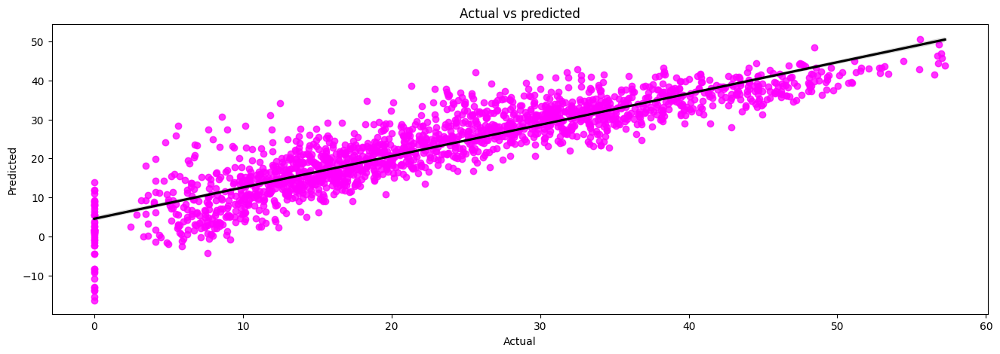

In [ ]:
# Define a function to plot scatterplot for y_test and y_actual.
plot_scatter(ytest, pred_test_random_forest)

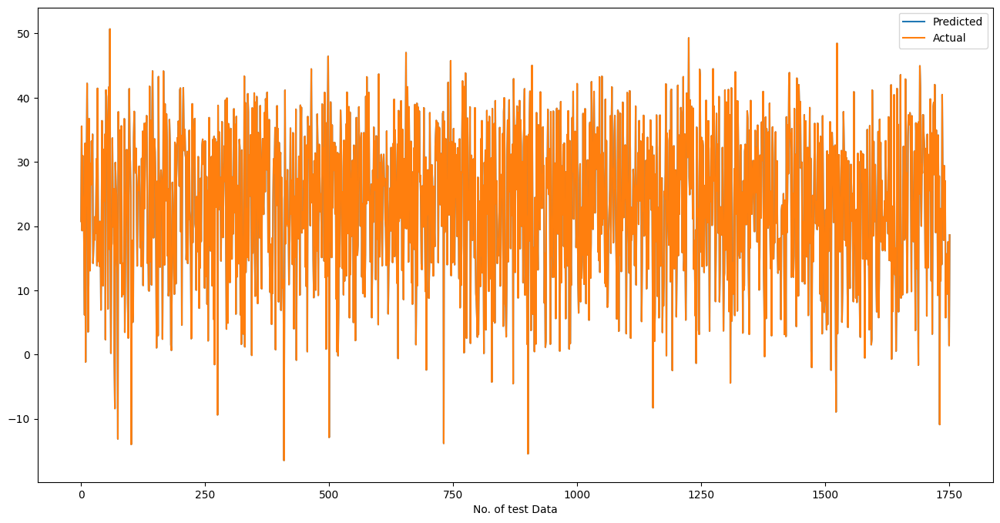

In [ ]:
# Actual vs predicted for linear regression plot
plot_pred_vs_actual(ytest, pred_test_random_forest)

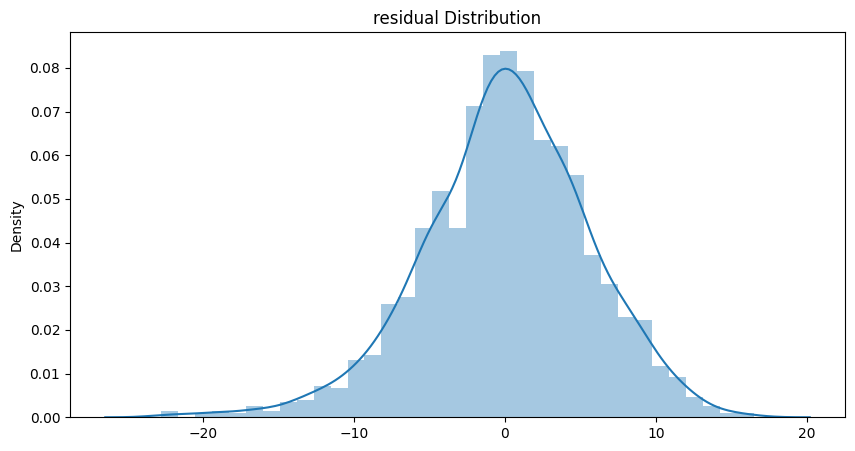

In [ ]:
# Residuals of the regression are normally distributed.
residual_distplot(ytest, pred_test_random_forest)

Features Store for Random Forest Regressor

In [ ]:
importances = random_forest_regressor_model.feature_importances_
importance_dict={"Feature":list(xtrain.columns),
                 "Feature Importance":importances}
importance_df=pd.DataFrame(importance_dict)

In [ ]:
importance_df["Feature Importance"]=round(importance_df["Feature Importance"],2)

In [ ]:
importance_df.sort_values(by=["Feature Importance"],ascending=False)

,Feature,Feature Importance
0,Temperature,0.30
1,Humidity,0.16
37,Functioning_Day_No,0.09
38,Functioning_Day_Yes,0.06
12,Hour_5,0.03
11,Hour_4,0.03
25,Hour_18,0.03
5,Rainfall,0.03
4,Solar_Radiation,0.03
31,Seasons_Autumn,0.02


In [ ]:
features=xtrain.columns
importances=random_forest_regressor_model.feature_importances_
indices=np.argsort(importances)

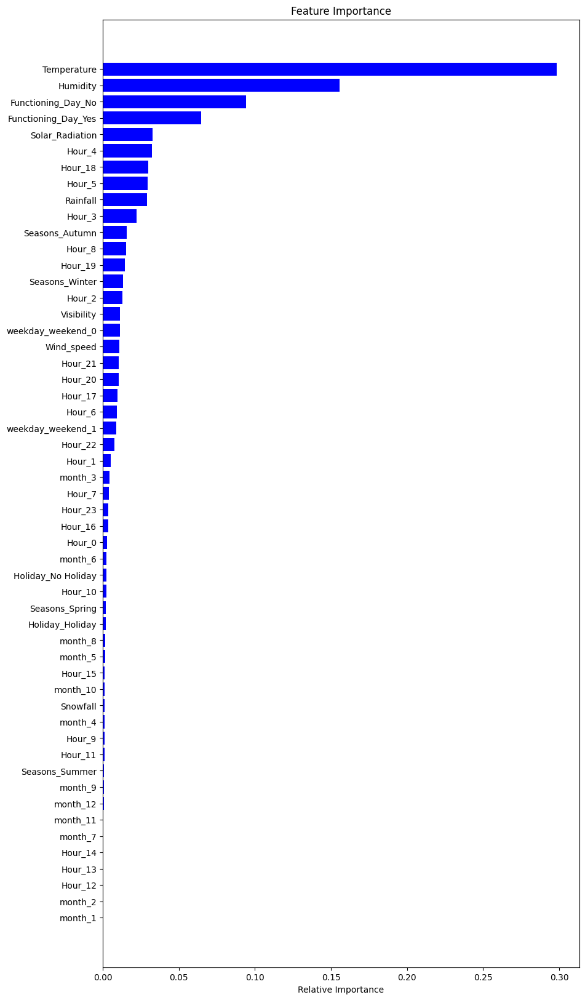

In [ ]:
#plot the figure
plt.figure(figsize=(10,20))
plt.title("Feature Importance")
plt.barh(range(len(indices)),importances[indices],color="blue",align="center")
plt.yticks(range(len(indices)),[features[i]for i in indices])
plt.xlabel("Relative Importance")
plt.show()

#####1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In this model mean_squared_error(MSE) for training set is 1.5 and R2_score is 0.99 and test set mean_squared_error(MSE) is 11.9 and r2_score is 0.92.  This means our Random Forest Regressor  model is performing well on the data but we will try to reduce the difference between train and test error by applying Hyperparameter tuning.

In this model Temperature, Humidity, Functioning_Day_No has much more weitages for this model.

## Random Forest Regressor with Hyperparameter Tuning.

In [ ]:
#Import library for Ridge
from sklearn.ensemble import RandomForestRegressor
rfr_hy=RandomForestRegressor(random_state=21)

# Import library for GridSearch CV
from sklearn.model_selection import GridSearchCV

# Apllying hyperparameter tuning for best value for lapha.

grid_values = {'max_depth':list(range(1,5,1)), "min_samples_leaf":list(range(1,5,1)), "min_samples_split":list(range(1,5,1))}
cv = GridSearchCV(rfr_hy, param_grid = grid_values, scoring = 'neg_mean_absolute_error', cv=5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval

{'max_depth': 4, 'min_samples_leaf': 3, 'min_samples_split': 2}

In [ ]:
#Import library for Ridge
from sklearn.ensemble import RandomForestRegressor

# Fit the Algorithm for Lasso
rfr_hy=RandomForestRegressor(max_depth=10, min_samples_leaf= 3, min_samples_split= 2 ,random_state=21)
model_rfr_hy=rfr_hy.fit(xtrain,ytrain)

# Predict on the model
pred_train_rfr_hy=model_rfr_hy.predict(xtrain)
pred_test_rfr_hy=model_rfr_hy.predict(xtest)

In [ ]:
#calculate Evaluation metric for training data
MSE  = mean_squared_error(ytrain, pred_train_rfr_hy)
print("MSE:" , MSE)

#calculate root mean squared error for training data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for training data
MAE=mean_absolute_error(ytrain, pred_train_rfr_hy)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for training data
r2 = r2_score(ytrain, pred_train_rfr_hy)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytrain, pred_train_rfr_hy))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytrain, pred_train_rfr_hy))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE: 20.600918573911724
RMSE : 4.53882347904297
MAE : 3.2238718681040726
R2 : 0.8671046136168095
Adjusted R2 : 0.862956524406969


Looks like our train set's r2_score valuue is 0.86 that means our model is able to capture most of the data variance. Let's save it in a dataframe for later comparision.

In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict1={"Model":"Random Forest Regressor with Hyperparameter Tuning",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
training_df=training_df.append(dict1,ignore_index=True)

In [ ]:
MSE  = mean_squared_error(ytest, pred_test_rfr_hy)
print("MSE :" , MSE)

#calculate root mean squared error for testing data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for testing data
MAE=mean_absolute_error(ytest, pred_test_rfr_hy)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for testing data
r2 = r2_score(ytest, pred_test_rfr_hy)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytest, pred_test_rfr_hy))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 : ",1-(1-r2_score(ytest, pred_test_rfr_hy))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 25.626934783463643
RMSE : 5.062305283511026
MAE : 3.649113272941731
R2 : 0.8346435805018202
Adjusted R2 :  0.8294822788331491


The test set's R2_score 0.83. This means our Random Forest Regressor with Hyperparameter Tuning model is performing well on the data.

In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict2={"Model":"Random Forest Regressor with Hyperparameter Tuning",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
test_df=test_df.append(dict2,ignore_index=True)

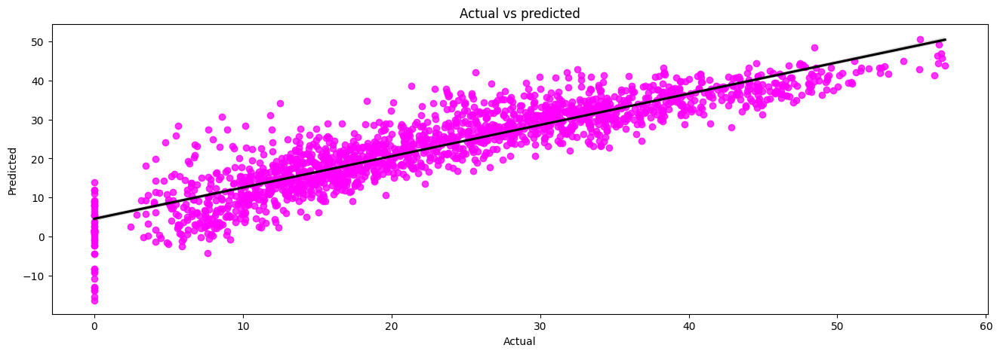

In [ ]:
# Define a function to plot scatterplot for y_test and y_actual.
plot_scatter(ytest, pred_test_rfr_hy)

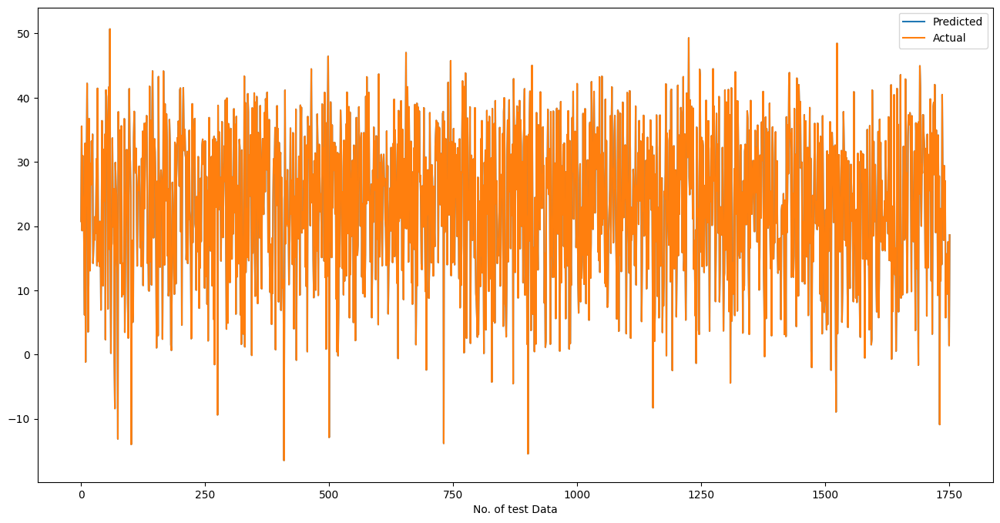

In [ ]:
# Actual vs predicted for linear regression plot
plot_pred_vs_actual(ytest, pred_test_rfr_hy)

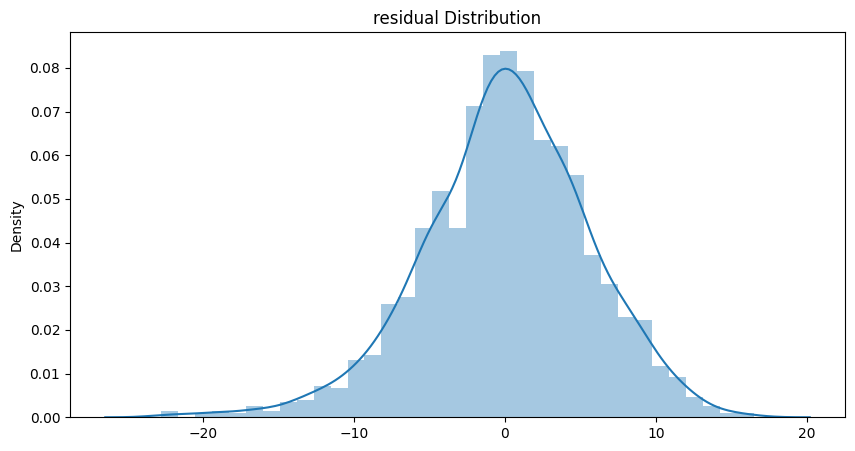

In [ ]:
# Residuals of the regression are normally distributed.
residual_distplot(ytest, pred_test_rfr_hy)

Featyres Store for Random Forest Regressor

In [ ]:
importances = model_rfr_hy.feature_importances_
importance_dict={"Feature":list(xtrain.columns),
                 "Feature Importance":importances}
importance_df=pd.DataFrame(importance_dict)

In [ ]:
importance_df["Feature Importance"]=round(importance_df["Feature Importance"],2)

In [ ]:
importance_df.sort_values(by=["Feature Importance"],ascending=False)

,Feature,Feature Importance
0,Temperature,0.33
1,Humidity,0.17
37,Functioning_Day_No,0.10
38,Functioning_Day_Yes,0.09
11,Hour_4,0.04
12,Hour_5,0.03
4,Solar_Radiation,0.03
5,Rainfall,0.03
25,Hour_18,0.03
10,Hour_3,0.03


In [ ]:
features=xtrain.columns
importances=model_rfr_hy.feature_importances_
indices=np.argsort(importances)

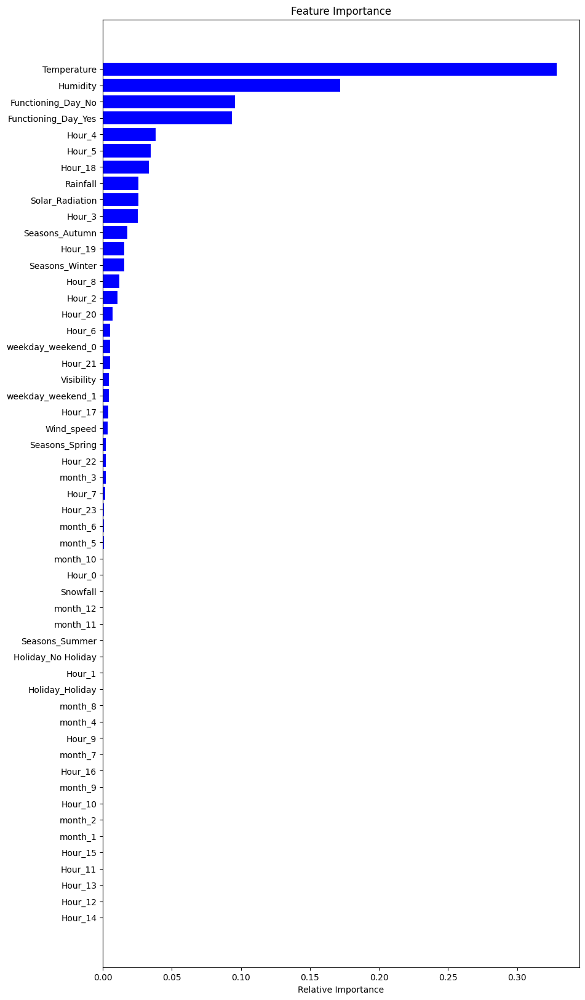

In [ ]:
#plot the figure
plt.figure(figsize=(10,20))
plt.title("Feature Importance")
plt.barh(range(len(indices)),importances[indices],color="blue",align="center")
plt.yticks(range(len(indices)),[features[i]for i in indices])
plt.xlabel("Relative Importance")
plt.show()

#####1. Which hyperparameter optimization technique have you used and why?

I have used GridSearchCV hyperparameter optimization technique. GridSearchCV is a commonly used technique for hyperparameter tuning. It performs an exhaustive search over specified hyperparameter values for an estimator, and evaluates each combination using cross-validation. GridSearchCV helps to automate the process of parameter tuning, and helps to find the best combination of hyperparameters for the model, which in turn can improve its performance.

#####2. Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.


In this model mean_squared_error(MSE) for training set is 20 and R2_score is 0.86 and test set mean_squared_error(MSE) is 25 and r2_score is 0.83. This means our Random Forest Regressor with Hyperparameter tuning model is performing well on the data set, and we successfully reduce the difference between train and test error by applying Hyperparameter tuning.

In this model Temperature, Humidity, Functioning_Day_No has much more weitages for this model.

## Gradient Boosting Regression

In [ ]:
#Import library for LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
gbr=GradientBoostingRegressor()

# Fit the Algorithm
gb_model=gbr.fit(xtrain,ytrain)

# Predict on the model
pred_train_gb=gb_model.predict(xtrain)
pred_test_gb=gb_model.predict(xtest)

In [ ]:
#calculate mean squared error for training data
MSE  = mean_squared_error(ytrain, pred_train_gb)
print("MSE:" , MSE)

#calculate root mean squared error for training data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for training data
MAE=mean_absolute_error(ytrain, pred_train_gb)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for training data
r2 = r2_score(ytrain, pred_train_gb)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytrain, pred_train_gb))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytrain, pred_train_gb))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE: 18.363211220828177
RMSE : 4.2852317581232615
MAE : 3.2412113850489486
R2 : 0.8815399399947865
Adjusted R2 : 0.8778424233986285


In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict1={"Model":"Gradient Boosting Regression",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
training_df=training_df.append(dict1,ignore_index=True)

In [ ]:
#calculate mean squared error for testing data
MSE  = mean_squared_error(ytest, pred_test_gb)
print("MSE :" , MSE)

#calculate root mean squared error for testing data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for testing data
MAE=mean_absolute_error(ytest, pred_test_gb)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for testing data
r2 = r2_score(ytest, pred_test_gb)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytest, pred_test_gb))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytest, pred_test_gb))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 20.387628102866987
RMSE : 4.5152661165059795
MAE : 3.3835356438818844
R2 : 0.8684499252978974
Adjusted R2 : 0.864343827559846


In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict2={"Model":"Gradient Boosting Regression",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
test_df=test_df.append(dict2,ignore_index=True)

In [ ]:
result=pd.concat([training_df, test_df], keys=["Training_set","Testing_set"])
print(result)

                                                            Model    MAE  \
Training_set 0                                  Linear regression  4.270   
             1                                   Lasso regression  4.279   
             2                                   Ridge regression  4.270   
             3                             Elastic Net Regression  4.338   
             4                            Decision Tree Regressor  0.000   
             5      Decision Tree Regressor Hyperparameter Tuning  0.729   
             6                            Random Forest Regressor  0.774   
             7  Random Forest Regressor with Hyperparameter Tu...  3.224   
             8                       Gradient Boosting Regression  3.241   
Testing_set  0                                  Linear regression  4.268   
             1                                   Lasso regression  4.278   
             2                                   Ridge regression  4.268   
            

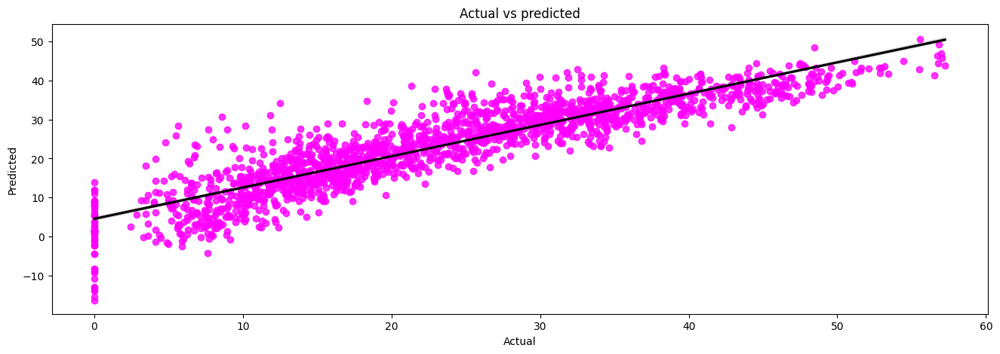

In [ ]:
# Define a function to plot scatterplot for y_test and y_actual.
plot_scatter(ytest, pred_test_gb)

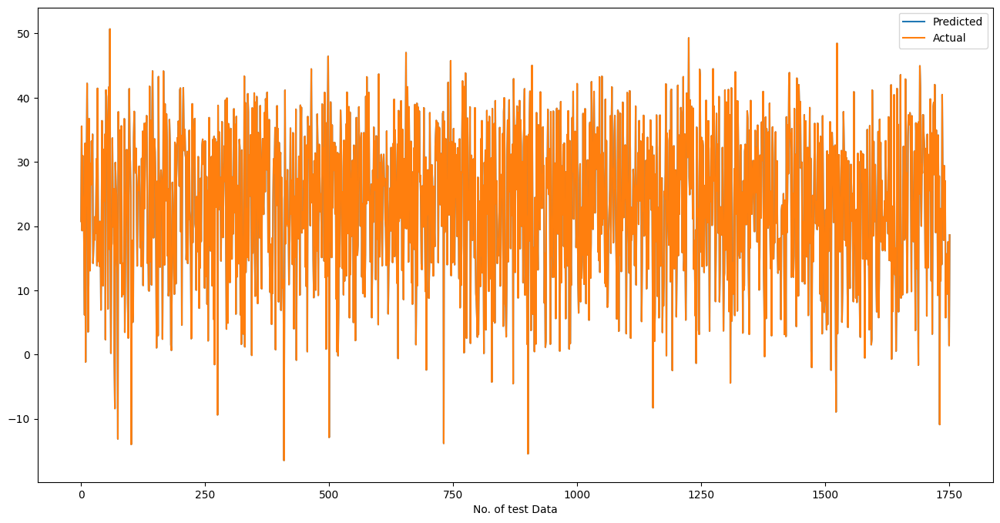

In [ ]:
# Actual vs predicted for linear regression plot
plot_pred_vs_actual(ytest, pred_test_gb)

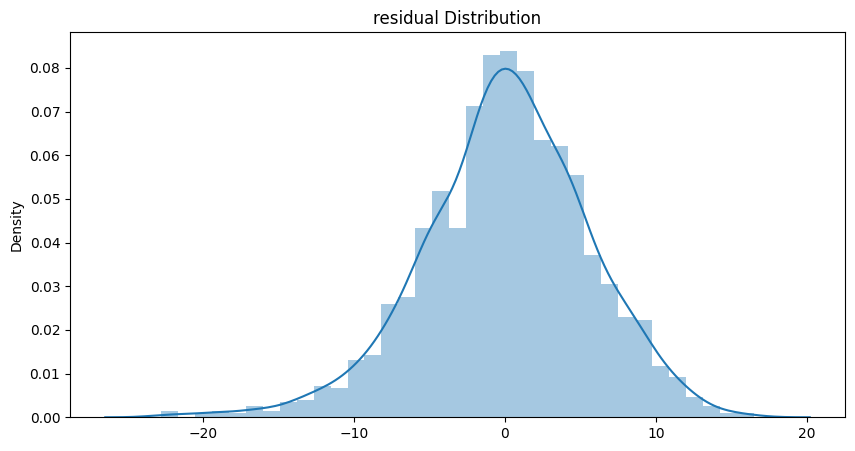

In [ ]:
# Residuals of the regression are normally distributed.
residual_distplot(ytest, pred_test_gb)

FEATURES STORED GRADIENT BOOSTING REGRESSION

In [ ]:
importances = gb_model.feature_importances_
importance_dict={"Feature":list(xtrain.columns),
                 "Feature Importance":importances}
importance_df=pd.DataFrame(importance_dict)

In [ ]:
importance_df["Feature Importance"]=round(importance_df["Feature Importance"],2)

In [ ]:
importance_df.sort_values(by=["Feature Importance"],ascending=False)

,Feature,Feature Importance
0,Temperature,0.31
38,Functioning_Day_Yes,0.13
1,Humidity,0.12
37,Functioning_Day_No,0.07
4,Solar_Radiation,0.05
5,Rainfall,0.05
11,Hour_4,0.03
34,Seasons_Winter,0.03
25,Hour_18,0.03
31,Seasons_Autumn,0.02


In [ ]:
features=xtrain.columns
importances=gb_model.feature_importances_
indices=np.argsort(importances)

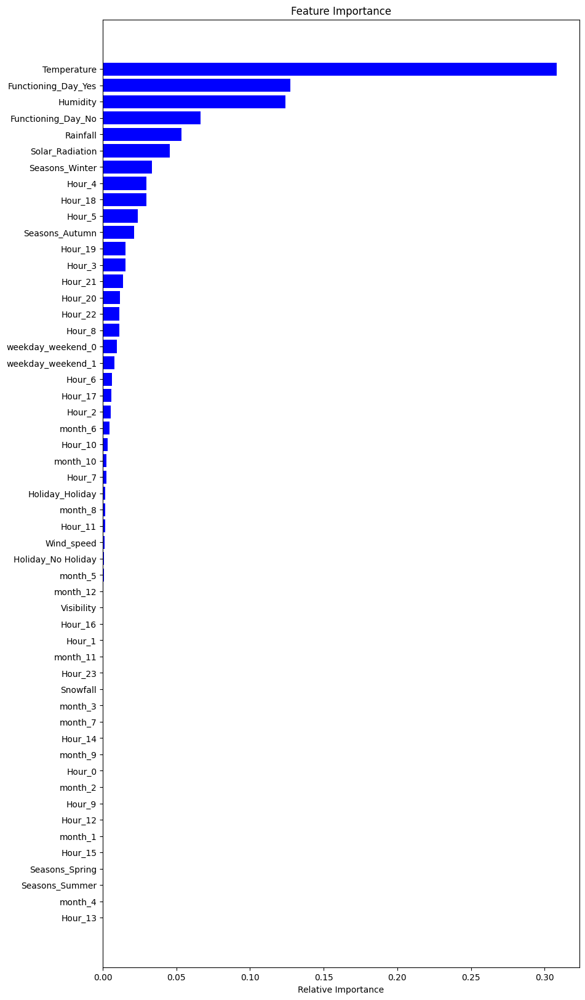

In [ ]:
#plot the figure
plt.figure(figsize=(10,20))
plt.title("Feature Importance")
plt.barh(range(len(indices)),importances[indices],color="blue",align="center")
plt.yticks(range(len(indices)),[features[i]for i in indices])
plt.xlabel("Relative Importance")
plt.show()

## Gradient Boosting Regression with Hyperparameter Tuning

In [ ]:
#import the pakages
from sklearn.ensemble import GradientBoostingRegressor
gbr_hy=GradientBoostingRegressor()

# Import library for GridSearch CV
from sklearn.model_selection import GridSearchCV

# Apllying hyperparameter tuning for best value for lapha.

grid_values = {'n_estimators':[80,90,100,110], 'max_depth':[9,10,11,12]}
cv = GridSearchCV(gbr_hy, param_grid = grid_values, scoring = 'neg_mean_absolute_error', cv=5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval

{'max_depth': 10, 'n_estimators': 110}

In [ ]:
#Import library for LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
gbr_hy=GradientBoostingRegressor(max_depth= 10, n_estimators= 110)

# Fit the Algorithm
gb_hy_model=gbr_hy.fit(xtrain,ytrain)

# Predict on the model
pred_test_gb_hy=gb_hy_model.predict(xtest)
pred_train_gb_hy=gb_hy_model.predict(xtrain)

In [ ]:
#calculate mean squared error for training data
MSE  = mean_squared_error(ytrain, pred_train_gb_hy)
print("MSE:" , MSE)

#calculate root mean squared error for training data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for training data
MAE=mean_absolute_error(ytrain, pred_train_gb_hy)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for training data
r2 = r2_score(ytrain, pred_train_gb_hy)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytrain, pred_train_gb_hy))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytrain, pred_train_gb_hy))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE: 0.7993949371585128
RMSE : 0.8940888866094426
MAE : 0.5992094623442996
R2 : 0.994843147471056
Adjusted R2 : 0.9946821856430029


In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict1={"Model":"Gradient Boosting Regression with Hyperparameter Tuning",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
training_df=training_df.append(dict1,ignore_index=True)

In [ ]:
#calculate mean squared error for testing data
MSE  = mean_squared_error(ytest, pred_test_gb_hy)
print("MSE :" , MSE)

#calculate root mean squared error for testing data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for testing data
MAE=mean_absolute_error(ytest, pred_test_gb_hy)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for testing data
r2 = r2_score(ytest, pred_test_gb_hy)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytest, pred_test_gb_hy))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytest, pred_test_gb_hy))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 10.882935330205958
RMSE : 3.298929421828536
MAE : 2.0825401867917726
R2 : 0.9297784446310642
Adjusted R2 : 0.9275866057414567


In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict2={"Model":"Gradient Boosting Regressor with Hyperparameter Tuning",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
test_df=test_df.append(dict2,ignore_index=True)

In [ ]:
result=pd.concat([training_df, test_df], keys=["Training_set","Testing_set"])
print(result)

                                                            Model    MAE  \
Training_set 0                                  Linear regression  4.270   
             1                                   Lasso regression  4.279   
             2                                   Ridge regression  4.270   
             3                             Elastic Net Regression  4.338   
             4                            Decision Tree Regressor  0.000   
             5      Decision Tree Regressor Hyperparameter Tuning  0.729   
             6                            Random Forest Regressor  0.774   
             7  Random Forest Regressor with Hyperparameter Tu...  3.224   
             8                       Gradient Boosting Regression  3.241   
             9  Gradient Boosting Regression with Hyperparamet...  0.599   
Testing_set  0                                  Linear regression  4.268   
             1                                   Lasso regression  4.278   
            

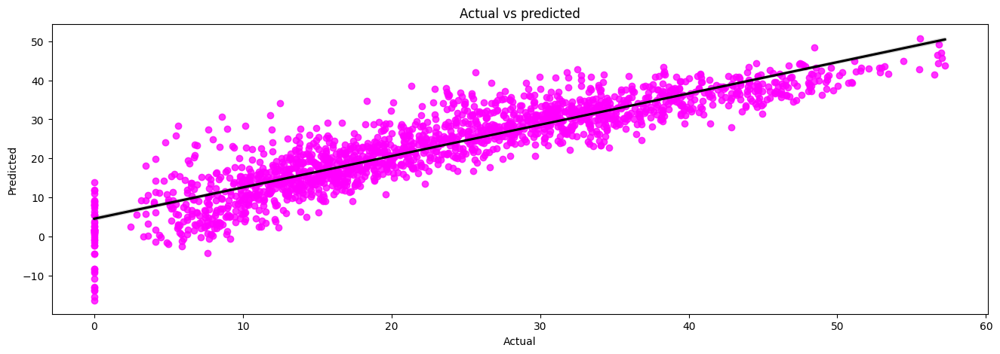

In [ ]:
# Define a function to plot scatterplot for y_test and y_actual.
plot_scatter(ytest, pred_test_gb_hy)

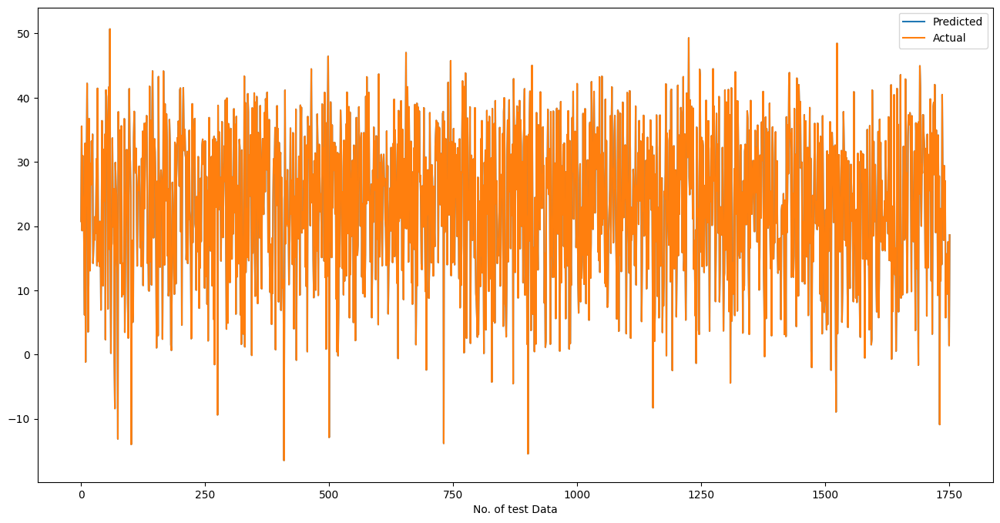

In [ ]:
# Actual vs predicted for linear regression plot
plot_pred_vs_actual(ytest, pred_test_gb_hy)

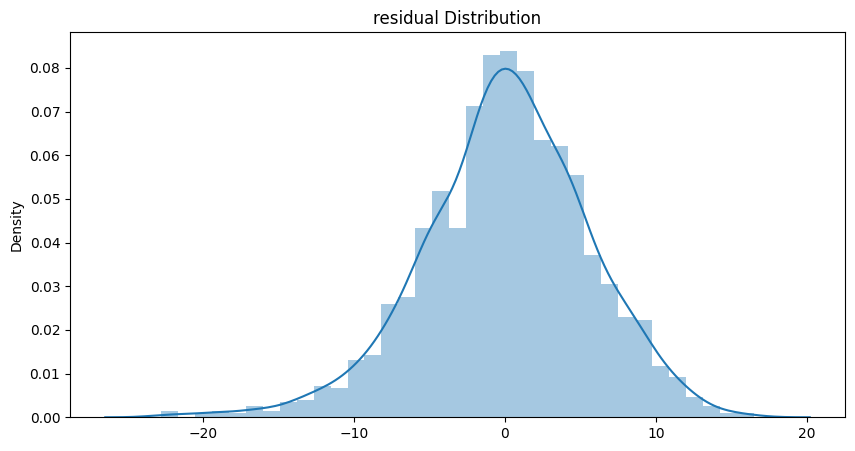

In [ ]:
# Residuals of the regression are normally distributed.
residual_distplot(ytest, pred_test_gb_hy)

FEATURES STORED

In [ ]:
importances = gb_hy_model.feature_importances_
importance_dict={"Feature":list(xtrain.columns),
                 "Feature Importance":importances}
importance_df=pd.DataFrame(importance_dict)

In [ ]:
importance_df["Feature Importance"]=round(importance_df["Feature Importance"],2)

In [ ]:
importance_df.sort_values(by=["Feature Importance"],ascending=False)

,Feature,Feature Importance
0,Temperature,0.29
1,Humidity,0.15
38,Functioning_Day_Yes,0.11
37,Functioning_Day_No,0.06
4,Solar_Radiation,0.04
5,Rainfall,0.04
12,Hour_5,0.03
25,Hour_18,0.03
11,Hour_4,0.03
34,Seasons_Winter,0.02


In [ ]:
features=xtrain.columns
importances=gb_hy_model.feature_importances_
indices=np.argsort(importances)

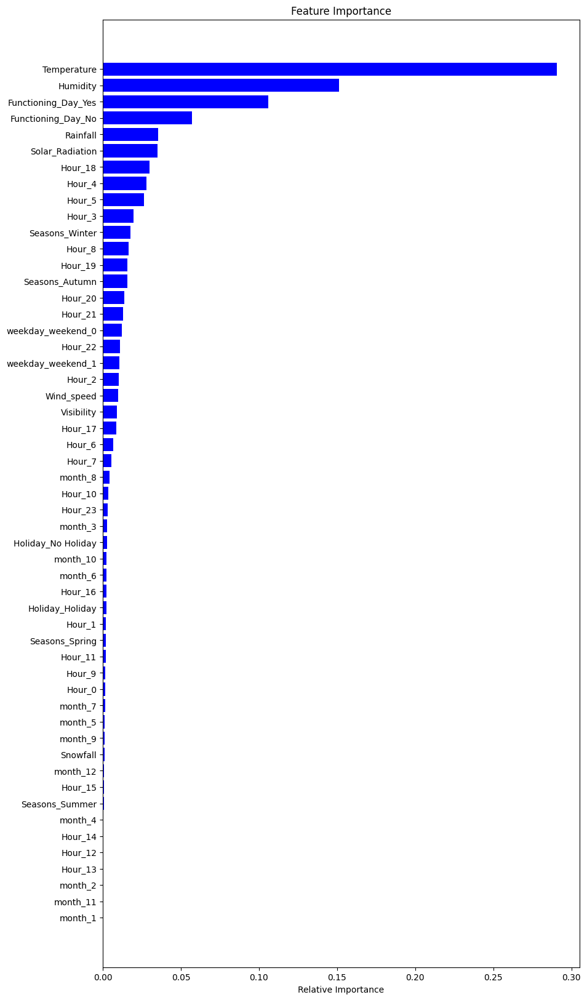

In [ ]:
#plot the figure
plt.figure(figsize=(10,20))
plt.title("Feature Importance")
plt.barh(range(len(indices)),importances[indices],color="blue",align="center")
plt.yticks(range(len(indices)),[features[i]for i in indices])
plt.xlabel("Relative Importance")
plt.show()

## XGBoost Regression

In [ ]:
#import the pakages
from xgboost import XGBRegressor
xgb=XGBRegressor()

# Fit the Algorithm
xgb_model=xgb.fit(xtrain,ytrain)

# Predict on the model
pred_test_xgb=xgb_model.predict(xtest)
pred_train_xgb=xgb_model.predict(xtrain)

In [ ]:
#calculate Evaluation metric for training data
MSE  = mean_squared_error(ytrain, pred_train_xgb)
print("MSE :" , MSE)

#calculate root mean squared error for training data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for training data
MAE=mean_absolute_error(ytrain, pred_train_xgb)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for training data
r2 = r2_score(ytrain, pred_train_xgb)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytrain, pred_train_xgb))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytrain, pred_train_xgb))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 2.398097634754026
RMSE : 1.5485792310224318
MAE : 1.0821678042285117
R2 : 0.984530004785377
Adjusted R2 : 0.9840471368546496


In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict1={"Model":"XGBoost Regression",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
training_df=training_df.append(dict1,ignore_index=True)

In [ ]:
#calculate Evaluation metric for testing data
MSE  = mean_squared_error(ytest, pred_test_xgb)
print("MSE :" , MSE)

#calculate root mean squared error for testing data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for testing data
MAE=mean_absolute_error(ytest, pred_test_xgb)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for testing data
r2 = r2_score(ytest, pred_test_xgb)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytest, pred_test_xgb))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 : ",1-(1-r2_score(ytest, pred_test_xgb))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 10.617952704123779
RMSE : 3.2585200174502194
MAE : 2.1728655475080427
R2 : 0.9314882307856865
Adjusted R2 :  0.9293497597795861


In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict2={"Model":"XGBoost Regression",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
test_df=test_df.append(dict2,ignore_index=True)

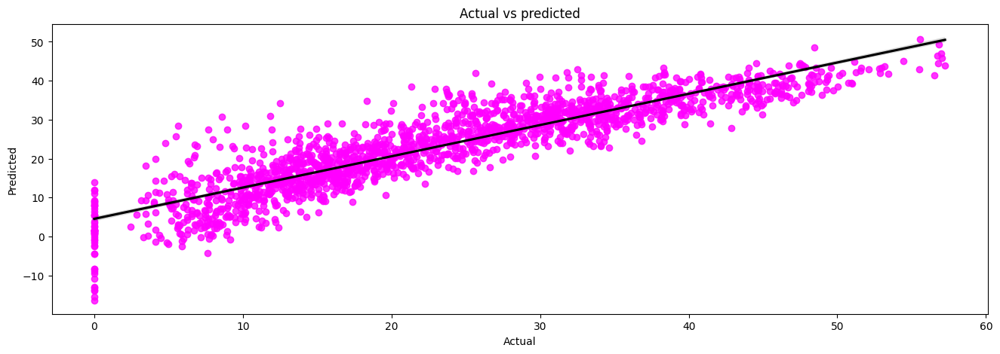

In [ ]:
# Define a function to plot scatterplot for y_test and y_actual.
plot_scatter(ytest, pred_test_xgb)

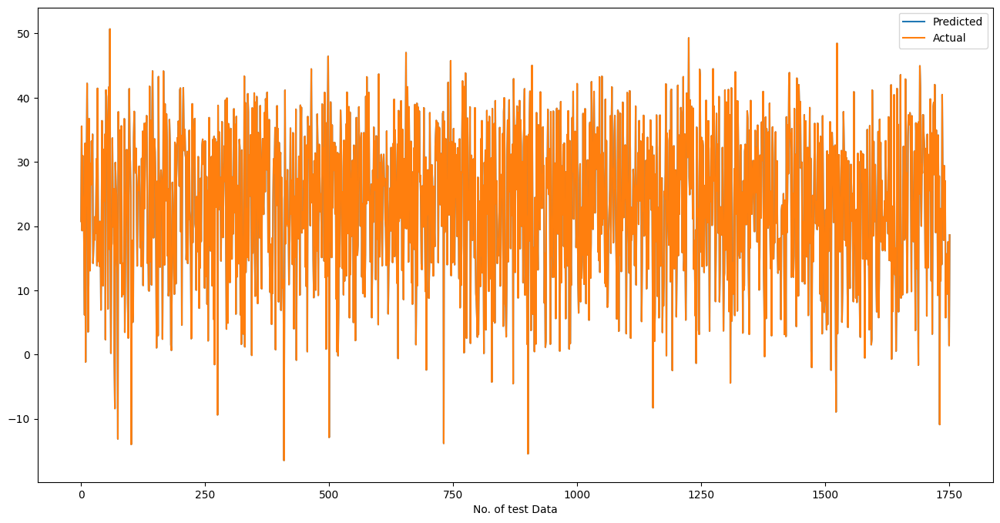

In [ ]:
# Actual vs predicted for linear regression plot
plot_pred_vs_actual(ytest, pred_test_xgb)

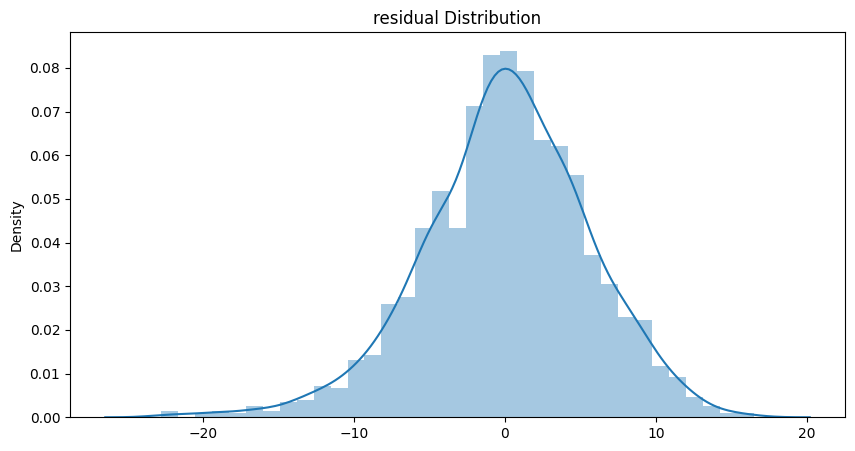

In [ ]:
# Residuals of the regression are normally distributed.
residual_distplot(ytest, pred_test_xgb)

FEATURES STORED

In [ ]:
importances = xgb_model.feature_importances_
importance_dict={"Feature":list(xtrain.columns),
                 "Feature Importance":importances}
importance_df=pd.DataFrame(importance_dict)

In [ ]:
importance_df["Feature Importance"]=round(importance_df["Feature Importance"],2)

In [ ]:
importance_df.sort_values(by=["Feature Importance"],ascending=False)

,Feature,Feature Importance
37,Functioning_Day_No,0.14
34,Seasons_Winter,0.09
12,Hour_5,0.08
26,Hour_19,0.06
11,Hour_4,0.06
25,Hour_18,0.06
28,Hour_21,0.04
27,Hour_20,0.04
9,Hour_2,0.04
10,Hour_3,0.04


In [ ]:
features=xtrain.columns
importances=xgb_model.feature_importances_
indices=np.argsort(importances)

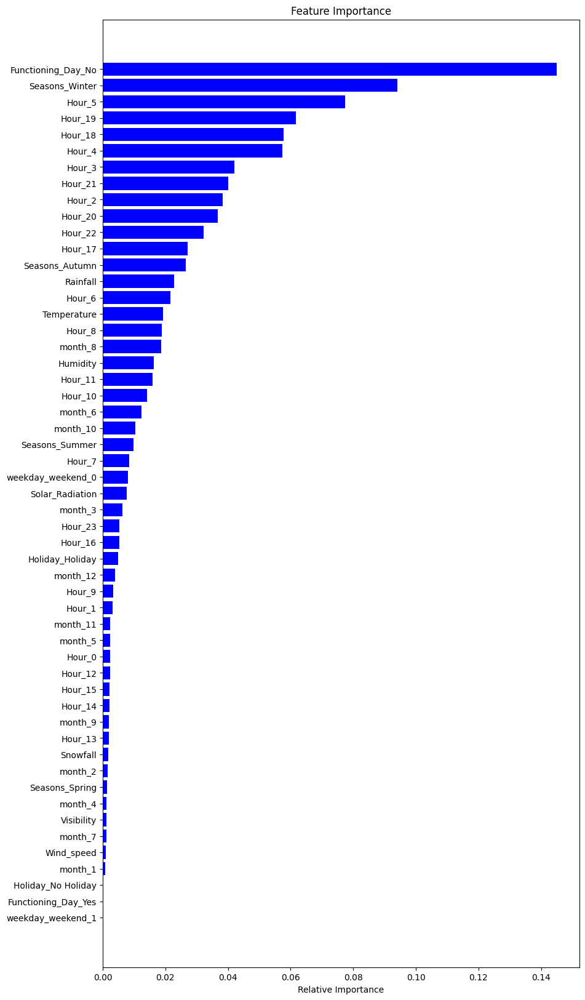

In [ ]:
#plot the figure
plt.figure(figsize=(10,20))
plt.title("Feature Importance")
plt.barh(range(len(indices)),importances[indices],color="blue",align="center")
plt.yticks(range(len(indices)),[features[i]for i in indices])
plt.xlabel("Relative Importance")
plt.show()

## XGBoost Regression with Hyperparameter tuning

In [ ]:
#import the pakages
from xgboost import XGBRegressor
xgb=XGBRegressor()

In [ ]:
# Import library for GridSearch CV
from sklearn.model_selection import GridSearchCV

# Apllying hyperparameter tuning for best value for lapha.

grid_values = {'n_estimators':[100,200,300], 'max_depth':[12,15,20]}
cv = GridSearchCV(xgb, param_grid = grid_values, scoring = 'neg_mean_absolute_error', cv=5)
cvmodel = cv.fit(xtrain,ytrain)
bestval =cvmodel.best_params_
bestval

{'max_depth': 20, 'n_estimators': 100}

In [ ]:
# Fit the Algorithm for XGBoost Regression with Hyperparameter tuning
xgb_hy=XGBRegressor(max_depth= 20, n_estimators= 100)
xgb_hy_model=xgb_hy.fit(xtrain,ytrain)

# Predict on the model
pred_train_xgb_hy=xgb_hy_model.predict(xtrain)
pred_test_xgb_hy=xgb_hy_model.predict(xtest)

In [ ]:
#calculate Evaluation metric for training data
MSE  = mean_squared_error(ytrain, pred_train_xgb_hy)
print("MSE :" , MSE)

#calculate root mean squared error for training data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for training data
MAE=mean_absolute_error(ytrain, pred_train_xgb_hy)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for training data
r2 = r2_score(ytrain, pred_train_xgb_hy)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytrain, pred_train_xgb_hy))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 :",1-(1-r2_score(ytrain, pred_train_xgb_hy))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 1.7876994015222787e-06
RMSE : 0.0013370487655737463
MAE : 0.000757623796641265
R2 : 0.99999998846765
Adjusted R2 : 0.9999999881076885


In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict1={"Model":"Gradient Boosting Regression with Hyperparameter Tuning",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
training_df=training_df.append(dict1,ignore_index=True)

In [ ]:
#calculate Evaluation metric for testing data
MSE  = mean_squared_error(ytest, pred_test_xgb_hy)
print("MSE :" , MSE)

#calculate root mean squared error for testing data
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

#calculate mean absolute error for testing data
MAE=mean_absolute_error(ytest, pred_test_xgb_hy)
print("MAE :" , MAE)

#calculate r2 and adjusted r2 for testing data
r2 = r2_score(ytest, pred_test_xgb_hy)
print("R2 :" ,r2)
Adjusted_R2=(1-(1-r2_score(ytest, pred_test_xgb_hy))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))
print("Adjusted R2 : ",1-(1-r2_score(ytest, pred_test_xgb_hy))*((xtest.shape[0]-1)/(xtest.shape[0]-xtest.shape[1]-1)))

MSE : 12.878122091340243
RMSE : 3.5886100500528393
MAE : 2.2029919534254323
R2 : 0.916904609276232
Adjusted R2 :  0.914310936892039


In [ ]:
# Storing the test set metrics value in a dataframe for later comparison
dict2={"Model":"Gradient Boosting Regression with Hyperparameter Tuning",
       "MAE":round((MAE),3),
       "MSE":round((MSE),3),
       "RMSE":round((RMSE),3),
       "R2":round((r2),3),
       "Adjusted R2":round((Adjusted_R2),3)}
test_df=test_df.append(dict2,ignore_index=True)

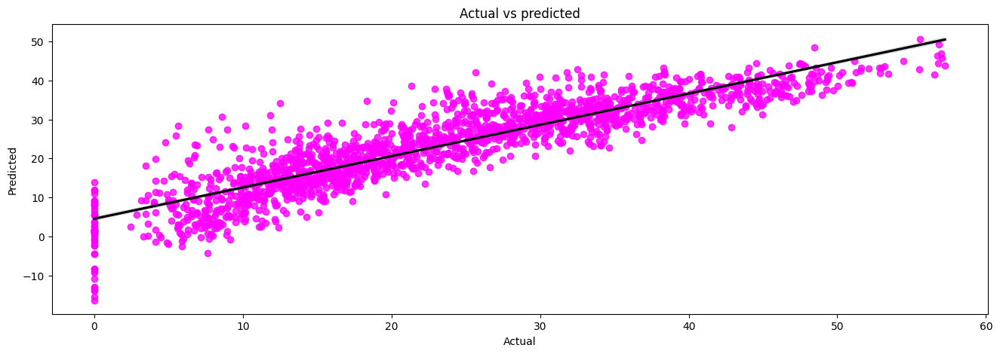

In [ ]:
# Define a function to plot scatterplot for y_test and y_actual.
plot_scatter(ytest, pred_test_xgb_hy)

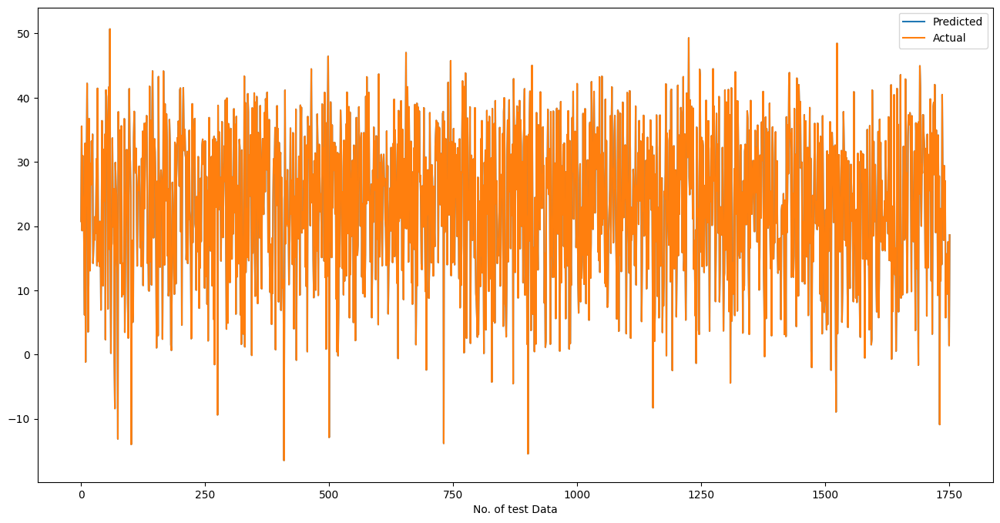

In [ ]:
# Actual vs predicted for linear regression plot
plot_pred_vs_actual(ytest, pred_test_xgb_hy)

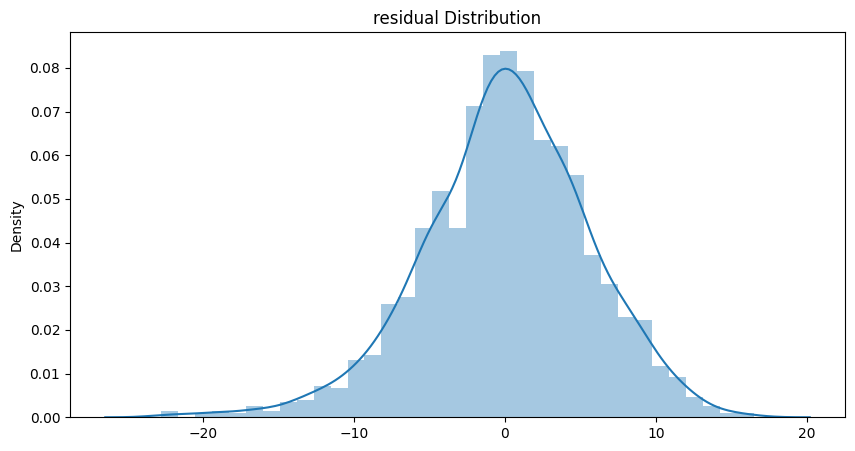

In [ ]:
# Residuals of the regression are normally distributed.
residual_distplot(ytest, pred_test_xgb_hy)

FEATURES STORED

In [ ]:
importances = xgb_hy_model.feature_importances_
importance_dict={"Feature":list(xtrain.columns),
                 "Feature Importance":importances}
importance_df=pd.DataFrame(importance_dict)

In [ ]:
importance_df["Feature Importance"]=round(importance_df["Feature Importance"],2)

In [ ]:
importance_df.sort_values(by=["Feature Importance"],ascending=False)

,Feature,Feature Importance
37,Functioning_Day_No,0.41
34,Seasons_Winter,0.23
25,Hour_18,0.06
11,Hour_4,0.04
12,Hour_5,0.03
5,Rainfall,0.03
10,Hour_3,0.02
15,Hour_8,0.02
26,Hour_19,0.02
28,Hour_21,0.01


In [ ]:
features=xtrain.columns
importances=xgb_hy_model.feature_importances_
indices=np.argsort(importances)

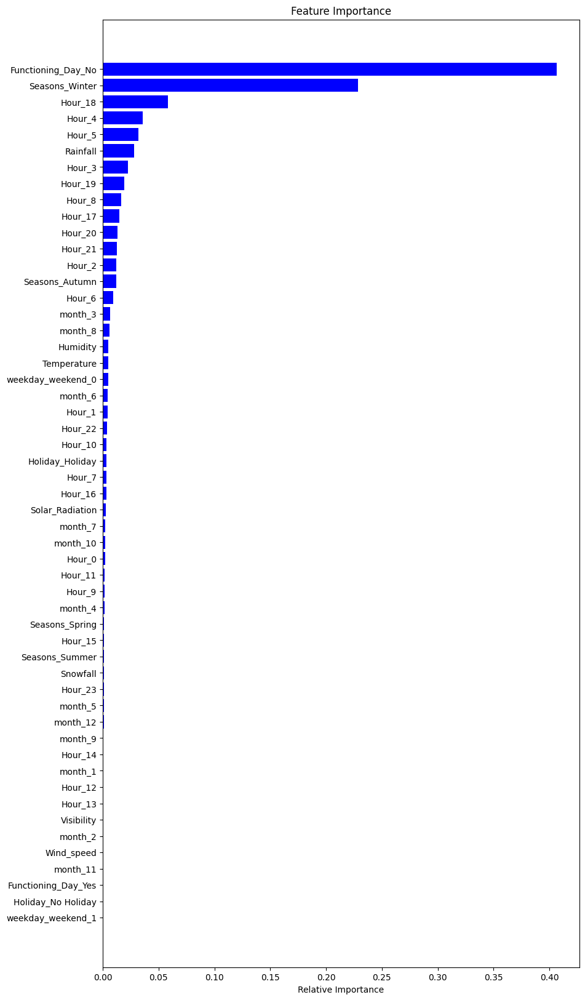

In [ ]:
#plot the figure
plt.figure(figsize=(10,20))
plt.title("Feature Importance")
plt.barh(range(len(indices)),importances[indices],color="blue",align="center")
plt.yticks(range(len(indices)),[features[i]for i in indices])
plt.xlabel("Relative Importance")
plt.show()

##1. Which Evaluation metrics did you consider for a positive business impact and why?

Most beginners and practitioners most of the time do not bother about the model performance. The talk is about building a well-generalized model, Machine learning model cannot have 100 per cent efficiency otherwise the model is known as a biased model. which further includes the concept of overfitting and underfitting.

*   Mean Absolute Error(MAE)=MAE is a very simple metric which calculates the absolute difference between actual and predicted values.

*   Mean Squared Error(MSE)=MSE is a most used and very simple metric with a little bit of change in mean absolute error. Mean squared error states that finding the squared difference between actual and predicted value.
*   Root Mean Squared Error(RMSE)=As RMSE is clear by the name itself, that it is a simple square root of mean squared error.


*   R Squared (R2)=R2 score is a metric that tells the performance of your model, not the loss in an absolute sense that how many wells did your model perform.

*   Adjusted R Squared=The disadvantage of the R2 score is while adding new features in data the R2 score starts increasing or remains constant but it never decreases because It assumes that while adding more data variance of data increases.






##2. Which ML model did you choose from the above created models as your final prediction model and why?

In [ ]:
# Displaying the results of evaluation metric values for all models.
result=pd.concat([training_df, test_df], keys=["Training_set","Testing_set"])
print(result)

                                                             Model    MAE  \
Training_set 0                                   Linear regression  4.270   
             1                                    Lasso regression  4.279   
             2                                    Ridge regression  4.270   
             3                              Elastic Net Regression  4.338   
             4                             Decision Tree Regressor  0.000   
             5       Decision Tree Regressor Hyperparameter Tuning  0.729   
             6                             Random Forest Regressor  0.774   
             7   Random Forest Regressor with Hyperparameter Tu...  3.224   
             8                        Gradient Boosting Regression  3.241   
             9   Gradient Boosting Regression with Hyperparamet...  0.599   
             10                                 XGBoost Regression  1.082   
             11  Gradient Boosting Regression with Hyperparamet...  0.001   

I have choose Gradient Boosting Regressor with Hyperparamete because they predict better results than other Regression models with the training Mean Squared Error(MSE) is 0.79 and testing Mean Squared Error is 10.88.

And 2nd best model is XGBoost Regression with the training Mean Squared Error(MSE) is 2.39 and testing Mean Squared Error is 10.61.

##3. Explain the model which you have used and the feature importance using any model explainability tool?

 I can explain the Gradient Boosting and XGBoost models and feature importance using a model explainability tool.

Gradient Boosting, The main idea behind this algorithm is to build models sequentially and these subsequent models try to reduce the errors of the previous model. This is done by building a new model on the errors or residuals of the previous model. Gradient Boosting can handle both regression and classification problems. The only difference between the two is the “Loss function”. The objective here is to minimize this loss function by adding weak learners using gradient descent. Since it is based on loss function hence for regression problems, we’ll have different loss functions like Mean squared error (MSE) and for classification, we will have different for e.g log-likelihood.

XGBoost, on the other hand, is a powerful tree-based ensemble learning algorithm that uses a series of decision trees to make predictions. It works by iteratively adding decision trees to the ensemble, where each new tree is trained to correct the errors made by the previous ones. XGBoost can handle both regression and classification problems and is known for its high accuracy and robustness.

To explain the feature importance of the Gradient Boosting and XGBoost models, we can use the SHAP (SHapley Additive explanations) model explainability tool. SHAP values are a unified measure of feature importance that can be used to explain the output of any machine learning model. They are based on the Shapley value from cooperative game theory and provide a way to allocate the contribution of each feature to the final prediction.

# **Conclusion**

During our analysis, we conducted an initial exploratory data analysis (EDA) on all the features in our dataset. Firstly, we analysed our dependent variable Rented Bike count and applied transformations as necessar. We then examined the categorical variables and removed those with majority of one class. We also studied the numerical variables, calculated their correlations, distribution and the their relationships with the dependent variable. Additionally we removed some numerical features that contained mostly 0 values and applied one hot encoding to the categorical variables

Subsequently, we employed 11 machine learning algorithms including Linear Regression, Lasso, Ridge, Elastic Net, Decision Tree, Random Forest and Gradient Booster, XGBoost. We also performed hyperparameter tuning to enhance the performance of our models. The evaluation of our models resulted in the following findings:

We train a model to predict the number of rented bike count in given weather conditions. First, we do Exploratory Data Analysis on the data set. We look for null values that is not found in dataset and outliers and appropriately modify them. We also perform correlation analysis to extract out the important and relevant feature set and later perform feature engineering.



*   Gradient Boosting Regressor with Hyperparamete model shows promising result with R2 score of 0.93, therefore it can be used to solve this problem.

*   Temperatue, Functioning Day Yes, Humidity Rainfall and Solar radiation are major driving factors for the Bike rent demand.

*   Bike demand shows peek around 8-9 AM in the morning and 6-7pm in the evening.
*   People prefer to rent bike more in summer than in winter.


*   Bike demand is more on clear days than on snowy or rainy days.


*   Temperature range from 22 to 25(°C) has more demand for bike

Although the current analysis may be insightful, it is important to note that the dataset is time-dependent and variables such as temperature, windspeed and solar radiation may not always remain consistent. As a result there may be situations where the model fails to perform well. As field of machine learning is constantly evolving, it is necessary to stay up to date with the latest developments and be prepared to handle unexpected scenarios. Maintaining a strong understanding of Machine Learning concepts will undoubtely provide an advantage in staying ahead in the future.

